In [1]:
from IPython.parallel import Client
c = Client(profile='parallel_python2.7')
dview = c.direct_view()
lview = c.load_balanced_view()

/usr/local/anaconda/lib/python2.7/site-packages/IPython/parallel.py:13: ShimWarning: The `IPython.parallel` package has been deprecated. You should import from ipyparallel instead.
  "You should import from ipyparallel instead.", ShimWarning)


IOError: Connection file '~/.ipython/profile_parallel_python2.7/security/ipcontroller-client.json' not found.
You have attempted to connect to an IPython Cluster but no Controller could be found.
Please double-check your configuration and ensure that a cluster is running.

In [2]:
import numpy as np
from scipy import io
from sstanalysis import gfd
from scipy import interpolate as naiso
from matplotlib import pyplot as plt
%matplotlib inline

In [2]:
with dview.sync_imports():
    import numpy
    import os
    import netCDF4
    import warnings
    from scipy import io
    from scipy import interpolate
    from matplotlib import pyplot
    from scipy import linalg
    from scipy import signal
    from scipy import fftpack
    from warnings import warn
    #from sstanalysis import popmodel

importing numpy on engine(s)
importing os on engine(s)
importing netCDF4 on engine(s)
importing warnings on engine(s)
importing io from scipy on engine(s)
importing interpolate from scipy on engine(s)
importing pyplot from matplotlib on engine(s)
importing linalg from scipy on engine(s)
importing signal from scipy on engine(s)
importing fftpack from scipy on engine(s)
importing warn from warnings on engine(s)


In [3]:
%%px --local
print 'Hello from engines AND client'

Hello from engines AND client
[stdout:0] Hello from engines AND client
[stdout:1] Hello from engines AND client
[stdout:2] Hello from engines AND client
[stdout:3] Hello from engines AND client
[stdout:4] Hello from engines AND client


In [6]:
dlat, dlon = (10., 10.)
lat_start, lat_end = (-60., 50.)
lon_start, lon_end = (5., 345.)
west, south = (lon_start, lat_start)
east, north = (west+dlon, south+dlat)
Degx, Degy = (int((lon_end-lon_start)/dlon), int((lat_end-lat_start)/dlat))
lon_global = np.arange(lon_start, lon_end+2*dlon, dlon)
lat_global = np.arange(lat_start, lat_end+2*dlat, dlat)
Lon_global, Lat_global = np.meshgrid(lon_global, lat_global)
psd_slopes_Feb_global = np.zeros((Degy+1,Degx+1))
#psd_slopes_Aug_global = np.zeros((Degy+1,Degx+1))
psd_level_Feb_global = np.zeros((Degy+1,Degx+1))
#psd_level_Aug_global = np.zeros((Degy+1,Degx+1))
L_1_global = np.zeros((Degy+1,Degx+1)) 
base_dir = '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/'

print Degx, Degy, (Degx+1)*(Degy+1)
print Lon_global.shape

34 11 420
(13, 36)


In [5]:
roll = -1080

fname = base_dir + 'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0046-02-01.nc'
f = netCDF4.Dataset(fname)
mask = f.variables['KMT'][:] <= 1
SST = 1e-2*f.variables['SST'][:]
tlon = np.roll(np.ma.masked_array(f.variables['TLONG'][:],mask), roll, axis=1)
tlat = np.roll(np.ma.masked_array(f.variables['TLAT'][:],mask), roll, axis=1)


lonrange=np.array([lon_start, lon_end])
latrange=np.array([lat_start, lat_end+5.])
lonmask = (tlon >= lonrange[0]) & (tlon < lonrange[1])
latmask = (tlat >= latrange[0]) & (tlat < latrange[1])
boxidx = lonmask & latmask # this won't necessarily be square
irange = np.where(boxidx.sum(axis=0))[0]
imin_bound, imax_bound = irange.min(), irange.max()
jrange = np.where(boxidx.sum(axis=1))[0]
jmin_bound, jmax_bound = jrange.min(), jrange.max()

In [6]:
def fit_loglog(x, y):
    # fig log vs log
    p = np.polyfit(np.log2(x), np.log2(y), 1)
    y_fit = 2**(np.log2(x)*p[0] + p[1])
    #A = np.vstack([np.log2(x), np.ones(len(x))]).T
    #a, b = np.linalg.lstsq(A, np.log2(y))[0]
    #y_fit = 2**(np.log2(x)*a + b)
    
    return y_fit, p[0]

In [7]:
base_dir = '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/'

dlat, dlon = (10., 10.)
lat_start, lat_end = (-60., 50.)
lon_start, lon_end = (5., 345.)
west, south = (lon_start, lat_start)
east, north = (west+dlon, south+dlat)
Degx, Degy = (int((lon_end-lon_start)/dlon), int((lat_end-lat_start)/dlat))
lon_global = np.arange(lon_start, lon_end+2*dlon, dlon)
lat_global = np.arange(lat_start, lat_end+2*dlat, dlat)
Lon_global, Lat_global = np.meshgrid(lon_global, lat_global)
L_1_global = np.zeros((Degy+1,Degx+1)) 

In [8]:
roll = -1080
fname = base_dir + 'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0046-02-01.nc'
f = netCDF4.Dataset(fname)
#SSH = 1e-2*f.variables['SSH_2'][:]
tlon = np.roll(np.ma.masked_array(f.variables['TLONG'][:],mask), roll, axis=1)
tlat = np.roll(np.ma.masked_array(f.variables['TLAT'][:],mask), roll, axis=1)
lonrange=np.array([lon_start, lon_end])
latrange=np.array([lat_start, lat_end+5.])
lonmask = (tlon >= lonrange[0]) & (tlon < lonrange[1])
latmask = (tlat >= latrange[0]) & (tlat < latrange[1])
boxidx = lonmask & latmask # this won't necessarily be square
irange = np.where(boxidx.sum(axis=0))[0]
imin_bound, imax_bound = irange.min(), irange.max()
jrange = np.where(boxidx.sum(axis=1))[0]
jmin_bound, jmax_bound = jrange.min(), jrange.max()


npzfile = np.load('interpLatnLon.npz')
print npzfile.files
tlat = npzfile['arr_0']
tlon = npzfile['arr_1']


#Nt, Ny, Nx = SSH.shape
#Ny_full = jmax_bound+100-jmin_bound
#Nx_full = imax_bound+100-imin_bound
#SSH_full = np.ma.zeros((Nt*5, Ny_full, Nx_full))
#SSH_masked = np.ma.zeros((Nt,Ny,Nx))
fname_mat = ['' for x in range(5)]

['arr_1', 'arr_0']


# Spectra #

In [15]:
N = 128
isospecs_ave = np.zeros((3,(Degy+1)*(Degx+1),N))
Deg_Free = np.zeros(3)
print isospecs_ave.shape

In [49]:
psd_slopes_summer_global = numpy.zeros((3, Degy+1,Degx+1))
psd_levels_summer_global = numpy.zeros((3, Degy+1,Degx+1))

In [56]:
month = 9
for yearnum in range(5):
    fname = os.path.join(base_dir,
                                 'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday%1d.%04d-%02d-01.nc' 
                                 % (1, yearnum+46, month))
    fname_mat[yearnum] = fname
    f = netCDF4.Dataset(fname)
    mask = f.variables['KMT'][:] <= 1
        
    #for i in range(Nt):
        #SSH_masked[i] = 1e-2*np.roll(np.ma.masked_array(f.variables['SSH_2'][i],mask), roll, axis=1)
    
    #SSH_full[Nt*yearnum:Nt*yearnum+Nt] = SSH_masked[:, jmin_bound:jmax_bound+100, imin_bound:imax_bound+100] 
    
mask_global = np.roll(mask, roll, axis=1)[jmin_bound:jmax_bound+100, imin_bound:imax_bound+100]
print fname_mat
    
Ny, Nx = tlon.shape
    
dview.scatter('fname', fname_mat)
dview['Nx_global'] = Nx
dview['Ny_global'] = Ny
dview['Lon'] = tlon
dview['Lat'] = tlat
dview['mask'] = mask_global
dview['imin_bound'] = imin_bound
dview['imax_bound'] = imax_bound
dview['jmin_bound'] = jmin_bound
dview['jmax_bound'] = jmax_bound
dview['lon_start'] = lon_start
dview['lat_start'] = lat_start
dview['lon_end'] = lon_end
dview['lat_end'] = lat_end
dview['dlon'] = dlon
dview['dlat'] = dlat
dview['Degx'] = Degx
dview['Degy'] = Degy
dview['N'] = N

['/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0046-09-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0047-09-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0048-09-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0049-09-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0050-09-01.nc']


In [57]:
%%px
import sys
sys.path.append('/home/takaya/sst_analysis/sstanalysis/')
import popmodel
reload(popmodel)
    
crit = 0.01
j,i = (0,0)
west, south = (lon_start, lat_start)
east, north = (west+dlon, south+dlat)
nanarray = numpy.zeros(N)
nanarray[:] = numpy.NAN

while south < lat_end+dlat:
    west = lon_start
    east = west+dlon
    i = 0
    while west < lon_end+dlon:

        lonrange = numpy.array([west,east])
        latrange = numpy.array([south,north])
        lonmask = (Lon >= lonrange[0]) & (Lon < lonrange[1])
        latmask = (Lat >= latrange[0]) & (Lat < latrange[1])
        boxidx = lonmask & latmask # this won't necessarily be square
        irange = numpy.where(boxidx.sum(axis=0))[0]
        imin, imax = irange.min(), irange.max()
        jrange = numpy.where(boxidx.sum(axis=1))[0]
        jmin, jmax = jrange.min(), jrange.max()
            #print imin, imax, jmin, jmax
        
        
        region_mask = mask[jmin:jmax, imin:imax]
        Ny, Nx = region_mask.shape
        land_fraction = region_mask.sum().astype('f8') / (Ny*Nx)
            #SSH_domain = SSH[..., jmin:jmax, imin:imax]

    
        if south < lat_end+dlat:
            if west < lon_end+dlon:
                if land_fraction<crit:
                    #print 'Index range (i): ', imin, imax
                    #print 'Index range (j): ', jmin, jmax
                    # February
                    #NtFeb = 0.
                    # load data files
                    nday = 1
                    for yearnum in range(len(fname)):
                        #daynum = 0
                        #for month in np.arange(1,13):
                        #fname = os.path.join(base_dir,
                                 #'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday%1d.%04d-02-01.nc' 
                                 #% (nday, yearnum+45))
                        #print fname
                        p = popmodel.POPFile(fname[yearnum])
                        #T = p.nc.variables['SST'][:]
                        Neff, Nt_month, Nx, Ny, k, l, spac2_ave_month, tilde2_sum_month, breve2_sum_month, Ki, isospec_month, area, lon, lat, land_frac, MAX_LAND = p.power_spectrum_2d(
                                                varname='SST', roll=-1080, xmin=imin, xmax=imax, ymin=jmin, ymax=jmax, ymin_bound=jmin_bound, ymax_bound=jmax_bound, xmin_bound=imin_bound, xmax_bound=imax_bound)
                        if yearnum == 0:
                            isospec_sum_month = numpy.zeros(N)
                            if j==0 and i==0:
                                isospecs_month = numpy.zeros(((Degx+1)*(Degy+1),N))
                                Kis_month = numpy.zeros(((Degx+1)*(Degy+1),N))
                        isospec_sum_month += isospec_month
                        #NtFeb += Nt_Feb

                        #isospec_ave_Feb = isospec_sum_Feb/yearnum
                    #
                    #print isospec_sum_Feb
                    isospecs_month[(Degx+1)*j+i] = isospec_sum_month
                    #if (Degx+1)*j+i>=400:
                    #    print (Degx+1)*j+i
                    #    print isospecs_month[(Degx+1)*j+i]
                    Kis_month[(Degx+1)*j+i] = Ki
               
                else:
                    isospecs_month[(Degx+1)*j+i] = nanarray
                    Kis_month[(Degx+1)*j+i] = nanarray
                    #if (Degx+1)*j+i>=400:
                    #    print (Degx+1)*j+i
                    #    print isospecs_month[(Degx+1)*j+i]
                    #print 'Too much land coverage'
                    #Lon_global[j,i] = tlon[jmin,imin]
                    #Lat_global[j,i] = tlat[jmin,imin]
                    #Lon_max[j,i] = tlon[jmin,imax]
                    #Lat_max[j,i] = tlat[jmax,imin]
                    #Lon_upright_corn = tlon[jmax,imax]
                    #Lat_upright_corn = tlat[jmax,imax]
                    #psd_slopes_Feb_global[j,i] = np.nan
                    #psd_slopes_Aug_global[j,i] = np.nan
                    #psd_level_Feb_global[j,i] = np.nan
                    #psd_level_Aug_global[j,i] = np.nan
                    #L_1_global[j,i] = np.nan
            
                    #plt.figure(figsize=(15,4))
                    #plt.subplot(121)
                    #plt.pcolormesh(tlon[jmin:jmax, imin:imax], tlat[jmin:jmax, imin:imax], SST_domain)
                    #plt.title('SST (Land coverage: %g)' % land_frac, fontsize=16)
                    #plt.xticks(fontsize=14)
                    #plt.yticks(fontsize=14)
            #else:
                #Lon_global[j,i] = tlon[jmin,imin]
                #Lat_global[j,i] = tlat[jmin,imin]
        #else:
            #Lon_global[j,i] = tlon[jmin,imin]
            #Lat_global[j,i] = tlat[jmin,imin]
        
        #if i>0:
            #print 'Zonal range is: ', Lon_global[j,i-1], Lon_global[j,i]
        #if j>0 and i==0:
            #print '  Meridional range is: ', Lat_global[j-1,i], Lat_global[j,i]
        west = east
        east = west+dlon
        i += 1
    
    south = north
    north = south+dlat
    j += 1
    
    
isospecs = numpy.reshape(isospecs_month.copy(),(Degx+1)*(Degy+1)*N)
Kis = numpy.reshape(Kis_month.copy(),(Degx+1)*(Degy+1)*N)

In [58]:
Neff = dview['Neff']
isospecs_full_month = dview.gather('isospecs').get()
Kis_full_month = dview.gather('Kis').get()

cluster_num = 5
isospecs_full = np.reshape(isospecs_full_month,(cluster_num,isospecs_full_month.shape[0]/N/cluster_num,N))
Kis = np.reshape(Kis_full_month,(cluster_num,isospecs_full_month.shape[0]/N/cluster_num,N))[0]

year_num = 5
index = 2
isospecs_ave[index] = isospecs_full.sum(axis=0)/(year_num*Neff[0]) 
Deg_Free[index] = Neff[0]*year_num
print isospecs_ave[index].shape, isospecs_full.sum(axis=0).shape, Deg_Free[index]

(420, 128) (420, 128) 15.0


In [59]:
#Le = 9e1
#Ls = 3e2
#Ns = 0
#Ne = 0
#for j in range(Degy+1):
#    for i in range(Degx+1):
        #for k in np.arange(1,100):
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Lss and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Ls:
        #        Ns = k
        #        print 'Ns: ', Ns
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Le and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Lee:
        #        Ne = k
        #        print 'Ne: ', Ne
#        Ns = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls)).argmin()
#        Ne = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le)).argmin()
            #print Ns, Ne
#        if np.all(np.isnan(isospecs_ave[index,(Degx+1)*j+i,Ns:Ne])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
#            ps_fit, ps_slope = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne])
#            psd_slopes_autumn_global[index,j,i] = ps_slope
#            psd_levels_autumn_global[index,j,i] = ps_fit[-1]
#        else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
#            psd_slopes_autumn_global[index,j,i] = np.NAN
#            psd_levels_autumn_global[index,j,i] = np.NAN

In [60]:
from tempfile import TemporaryFile
SST_summer_parallel = TemporaryFile()
np.savez('SST_summer_parallel', PSD=isospecs_ave, Ki=Kis, Deg_Freedom=Deg_Free)
SST_summer_parallel.seek(0)

In [4]:
npzfile = np.load('SST_winter_parallel.npz')
print npzfile.files
#psd_slopes_winter_global = npzfile['slopes']
#psd_levels_winter_global = npzfile['Plevel']
isospecs_ave_winter = npzfile['PSD']
Kis = npzfile['Ki']

npzfile = np.load('SST_summer_parallel.npz')
print npzfile.files
#psd_slopes_summer_global = npzfile['slopes']
#psd_levels_summer_global = npzfile['Plevel']
isospecs_ave_summer = npzfile['PSD']

['Ki', 'Deg_Freedom', 'PSD']
['Ki', 'Deg_Freedom', 'PSD']


In [54]:
npzfile = np.load('SST_spring_parallel.npz')
print npzfile.files
psd_slopes_spring_global = npzfile['slopes']
psd_levels_spring_global = npzfile['Plevel']
isospecs_ave_spring = npzfile['PSD']

npzfile = np.load('SST_autumn_parallel.npz')
print npzfile.files
psd_slopes_autumn_global = npzfile['slopes']
psd_levels_autumn_global = npzfile['Plevel']
isospecs_ave_autumn = npzfile['PSD']

['slopes', 'Plevel', 'Ki', 'PSD']
['slopes', 'Plevel', 'Ki', 'PSD']


In [12]:
#Le = 9e1
#Ls = 3e2
#Ns = 0
#Ne = 0
#for index in range(3):
#    for j in range(Degy+1):
#        for i in range(Degx+1):
        #for k in np.arange(1,100):
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Lss and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Ls:
        #        Ns = k
        #        print 'Ns: ', Ns
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Le and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Lee:
        #        Ne = k
        #        print 'Ne: ', Ne
#            Ns = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls)).argmin()
#            Ne = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le)).argmin()
            #print Ns, Ne
#            if np.all(np.isnan(isospecs_ave_spring[index,(Degx+1)*j+i,Ns:Ne])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
#                ps_fit, ps_slope = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave_spring[index,(Degx+1)*j+i,Ns:Ne])
#                psd_slopes_spring_global[index,j,i] = ps_slope
#                psd_levels_spring_global[index,j,i] = ps_fit[-1]
#            else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
#                psd_slopes_spring_global[index,j,i] = np.NAN
#                psd_levels_spring_global[index,j,i] = np.NAN
            
#            if np.all(np.isnan(isospecs_ave_summer[index,(Degx+1)*j+i,Ns:Ne])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
#                ps_fit, ps_slope = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave_summer[index,(Degx+1)*j+i,Ns:Ne])
#                psd_slopes_summer_global[index,j,i] = ps_slope
#                psd_levels_summer_global[index,j,i] = ps_fit[-1]
#            else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
#                psd_slopes_summer_global[index,j,i] = np.NAN
#                psd_levels_summer_global[index,j,i] = np.NAN
            
#            if np.all(np.isnan(isospecs_ave_autumn[index,(Degx+1)*j+i,Ns:Ne])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
#                ps_fit, ps_slope = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave_autumn[index,(Degx+1)*j+i,Ns:Ne])
#                psd_slopes_autumn_global[index,j,i] = ps_slope
#                psd_levels_autumn_global[index,j,i] = ps_fit[-1]
#            else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
#                psd_slopes_autumn_global[index,j,i] = np.NAN
#                psd_levels_autumn_global[index,j,i] = np.NAN
            
#            if np.all(np.isnan(isospecs_ave_winter[index,(Degx+1)*j+i,Ns:Ne])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
#                ps_fit, ps_slope = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave_winter[index,(Degx+1)*j+i,Ns:Ne])
#                psd_slopes_winter_global[index,j,i] = ps_slope
#                psd_levels_winter_global[index,j,i] = ps_fit[-1]
#            else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
#                psd_slopes_winter_global[index,j,i] = np.NAN
#                psd_levels_winter_global[index,j,i] = np.NAN

-c:15: RuntimeWarning: divide by zero encountered in divide
-c:16: RuntimeWarning: divide by zero encountered in divide


In [52]:
#from tempfile import TemporaryFile
#SST_summer_parallel = TemporaryFile()
#np.savez('SST_summer_parallel', slopes=psd_slopes_summer_global, Plevel=psd_levels_summer_global, PSD=isospecs_ave_summer, Ki=Kis)
#SST_summer_parallel.seek(0)

#from tempfile import TemporaryFile
#SST_winter_parallel = TemporaryFile()
#np.savez('SST_winter_parallel', slopes=psd_slopes_winter_global, Plevel=psd_levels_winter_global, PSD=isospecs_ave_winter, Ki=Kis)
#SST_winter_parallel.seek(0)

In [13]:
#from tempfile import TemporaryFile
#SST_autumn_parallel = TemporaryFile()
#np.savez('SST_autumn_parallel', slopes=psd_slopes_autumn_global, Plevel=psd_levels_autumn_global, PSD=isospecs_ave_autumn, Ki=Kis)
#SST_autumn_parallel.seek(0)

#from tempfile import TemporaryFile
#SST_spring_parallel = TemporaryFile()
#np.savez('SST_spring_parallel', slopes=psd_slopes_spring_global, Plevel=psd_levels_spring_global, PSD=isospecs_ave_spring, Ki=Kis)
#SST_spring_parallel.seek(0)

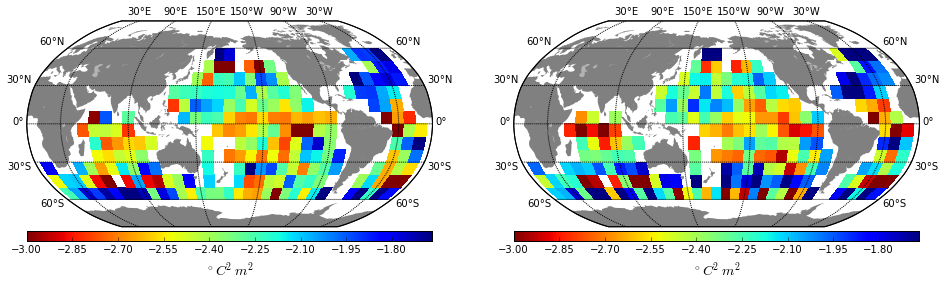

In [55]:
fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']


from mpl_toolkits.basemap import Basemap
m = Basemap(projection='robin', lon_0=180)
fig = plt.figure(figsize=(16,6))

axi = fig.add_subplot(121)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(psd_slopes_winter_global.mean(axis=0)), cmap='jet_r')
pc.set_clim([-3.,-5./3.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)
axi = fig.add_subplot(122)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(psd_slopes_summer_global.mean(axis=0)), cmap='jet_r')
pc.set_clim([-3.,-5./3.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)

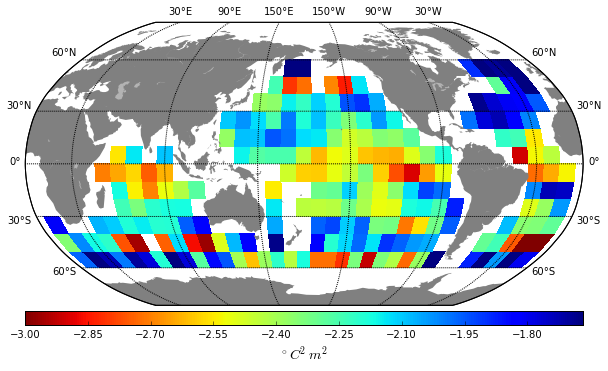

In [56]:
fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']

psd_slopes_year_global = psd_slopes_winter_global.sum(axis=0)+psd_slopes_spring_global.sum(axis=0)+psd_slopes_summer_global.sum(axis=0)+psd_slopes_autumn_global.sum(axis=0)

from mpl_toolkits.basemap import Basemap
m = Basemap(projection='robin', lon_0=180)
fig = plt.figure(figsize=(10,6))
axi = fig.add_subplot(111)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')

x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(psd_slopes_year_global/12.), cmap='jet_r')
pc.set_clim([-3.,-5./3.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)

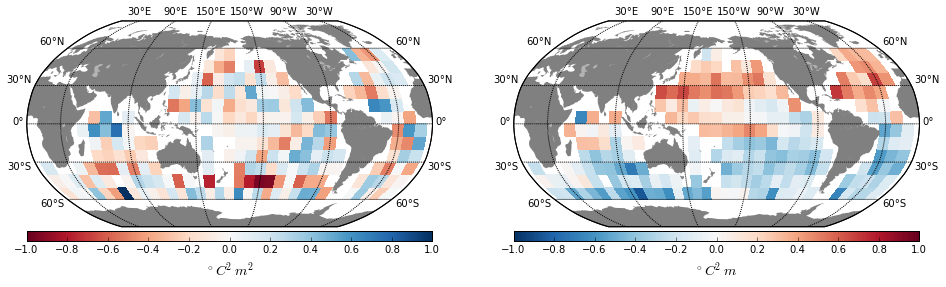

In [57]:
fig = plt.figure(figsize=(16,6))

axi = fig.add_subplot(121)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(psd_slopes_winter_global.mean(axis=0)-psd_slopes_summer_global.mean(axis=0)), cmap='RdBu')
pc.set_clim([-1.,1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)

axi = fig.add_subplot(122)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(np.log10(psd_levels_winter_global.mean(axis=0)/psd_levels_summer_global.mean(axis=0))), cmap='RdBu_r')
pc.set_clim([-1.,1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m$', fontsize=14)

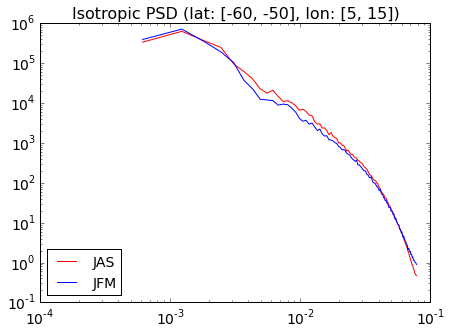

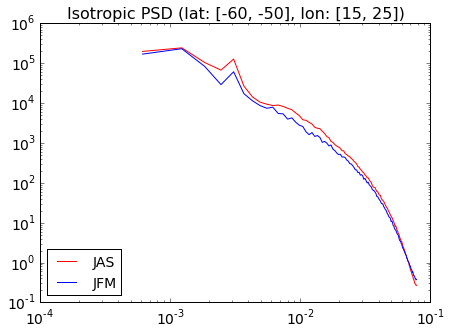

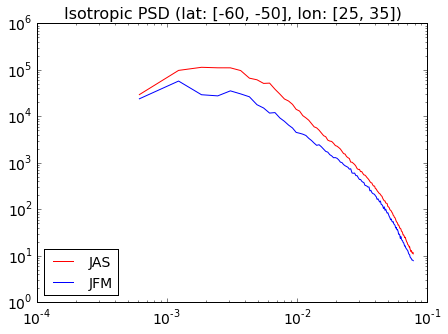

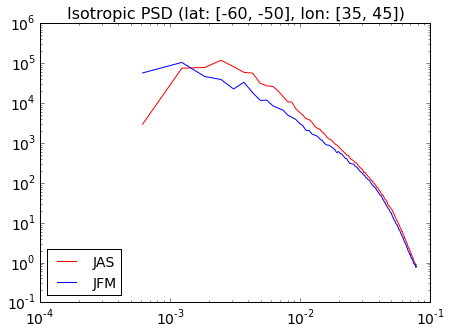

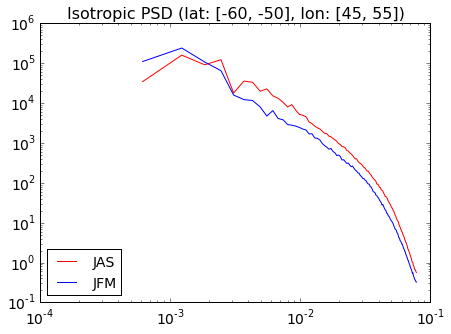

...

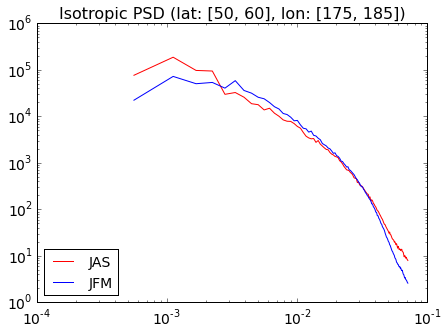

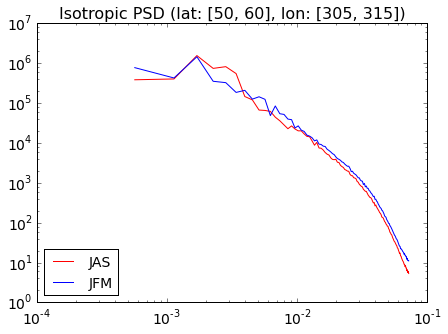

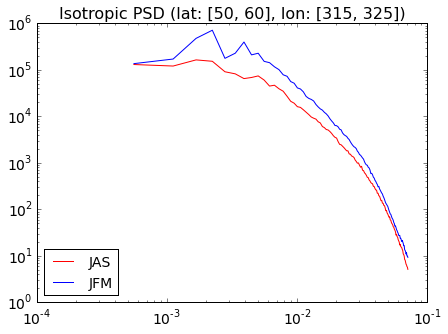

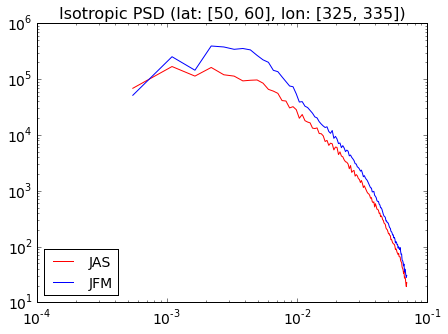

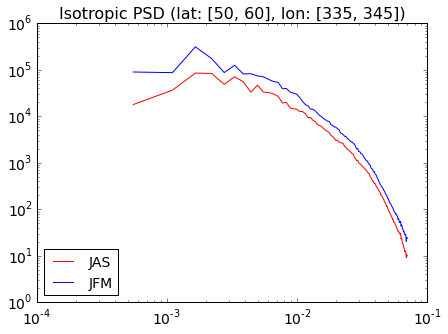

In [9]:
#latitude = np.reshape(Lat,((Degx+2)*(Degy+2),1))
#longitude = np.reshape(Lon,((Degx+2)*(Degy+2),1))

fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']

#Le = 9e1
#Ls = 3e2
N = 128
for j in range(Degy+1):
    for i in range(Degx+1):
        if np.all(np.isnan(isospecs_ave_summer.mean(axis=0)[(Degx+1)*j+i])) == False and np.all(np.isnan(isospecs_ave_winter.mean(axis=0)[(Degx+1)*j+i])) == False:
            
            #Ns = np.argmin(np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls))
            #Ne = np.argmin(np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le))
            #print 2*np.pi/Kis[(Degx+1)*j+i,Ns]*1e-3, 2*np.pi/Kis[(Degx+1)*j+i,Ne]*1e-3
            #print Kis[(Degx+1)*j+i,Ns]*.5/np.pi*1e3, Kis[(Degx+1)*j+i,Ne]*.5/np.pi*1e3
            
            #ps_fit_summer, ps_slope_summer = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne+1], isospecs_ave_summer.mean(axis=0)[(Degx+1)*j+i,Ns:Ne+1])
            #ps_fit_winter, ps_slope_winter = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne+1], isospecs_ave_winter.mean(axis=0)[(Degx+1)*j+i,Ns:Ne+1])
            plt.figure(figsize=(7,5))
            #plt.subplot(Degy+1,Degx+1,(Degx+1)*j+i+1)
            plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_ave_summer.mean(axis=0)[(Degx+1)*j+i], 'r', label=r'JAS')
            plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_ave_winter.mean(axis=0)[(Degx+1)*j+i], 'b', label=r'JFM')
            #plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_ave_summer.mean(axis=0)[(Degx+1)*j+i], 'r', label=r'Summer (slope: %g)' % ps_slope_summer)
            #plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_ave_winter.mean(axis=0)[(Degx+1)*j+i], 'b', label=r'Winter (slope: %g)' % ps_slope_winter)
            #plt.loglog(Kis[(Degx+1)*j+i,Ns:Ne+1]*.5/np.pi*1e3, ps_fit_summer, 'k')
            #plt.loglog(Kis[(Degx+1)*j+i,Ns:Ne+1]*.5/np.pi*1e3, ps_fit_winter, 'k')
            plt.legend(loc='lower left', fontsize=14)
            plt.title('Isotropic PSD (lat: [%g, %g], lon: [%g, %g])' % (Lat[j,0], Lat[j+1,0], Lon[0,i], Lon[0,i+1]), fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.show()

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


-c:11: RuntimeWarning: divide by zero encountered in divide
-c:12: RuntimeWarning: divide by zero encountered in divide


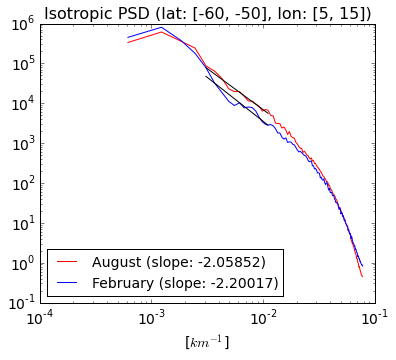

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


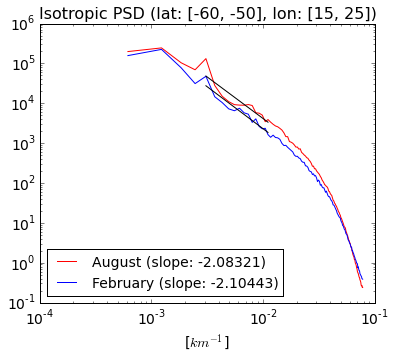

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


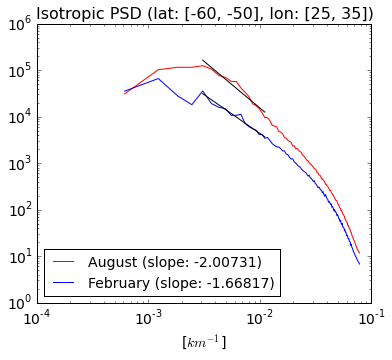

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


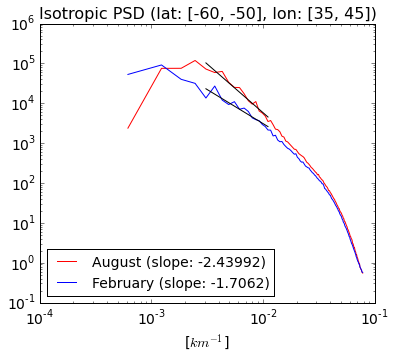

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


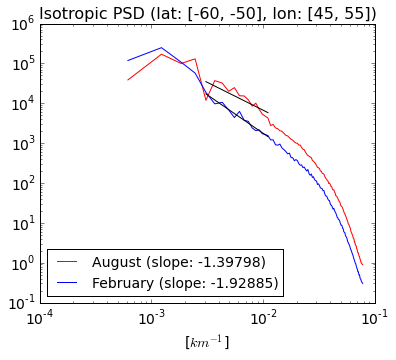

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


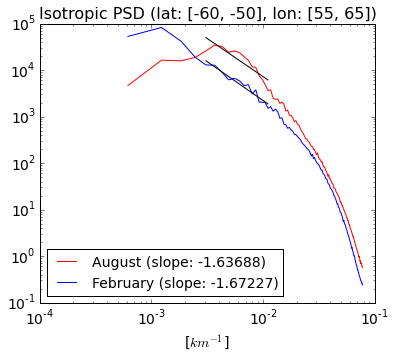

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


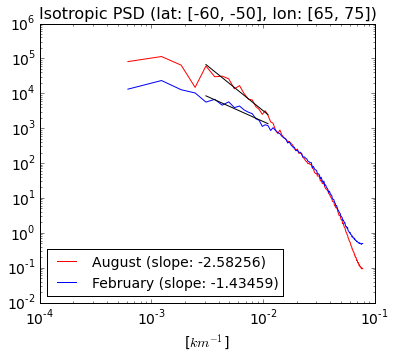

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


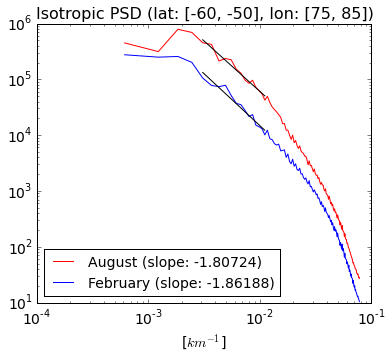

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


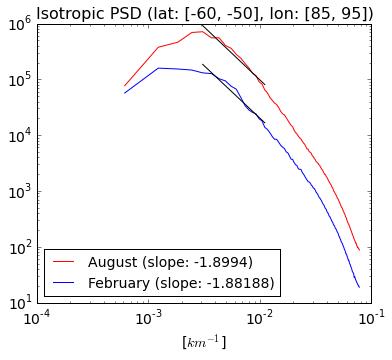

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


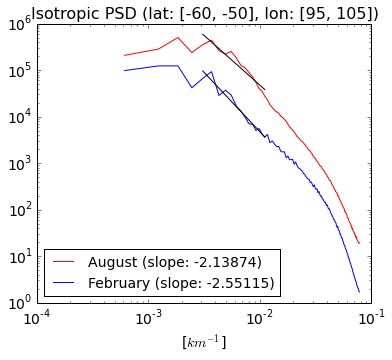

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


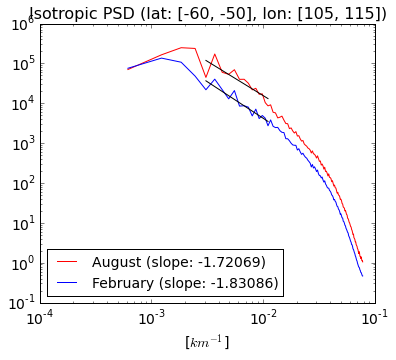

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


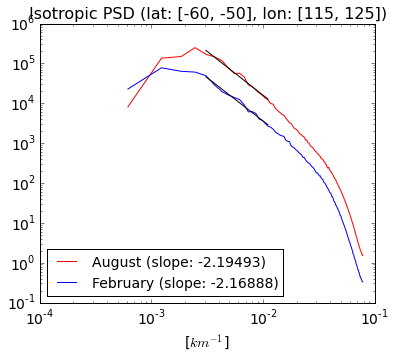

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


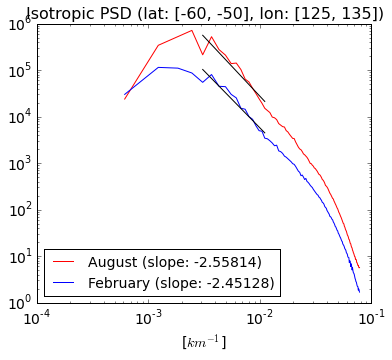

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


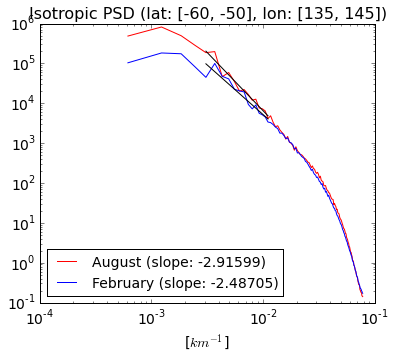

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


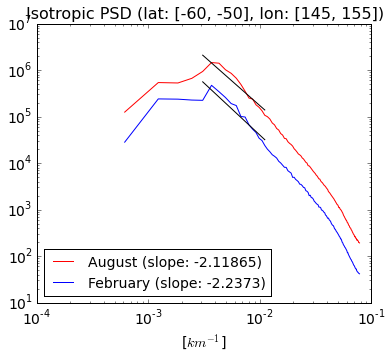

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


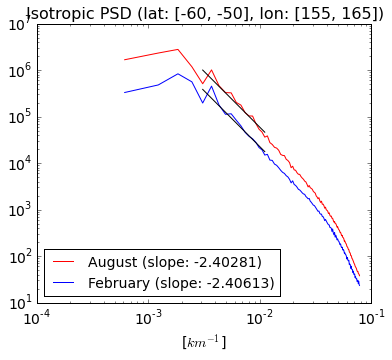

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


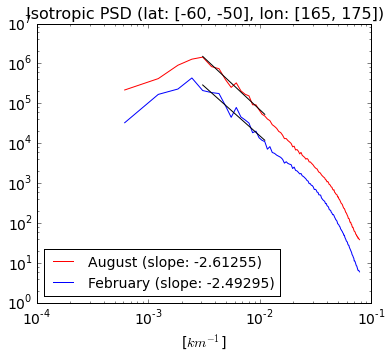

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


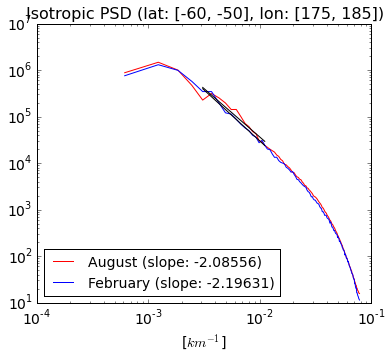

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


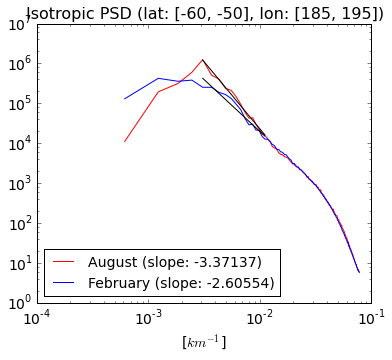

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


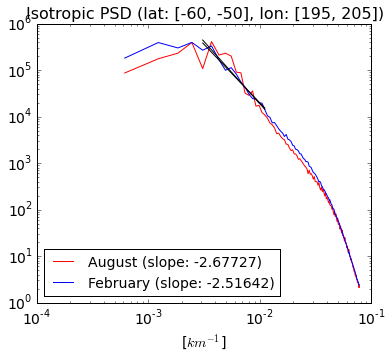

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


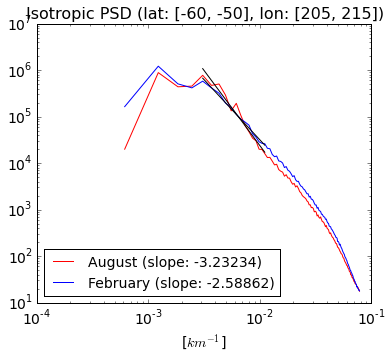

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


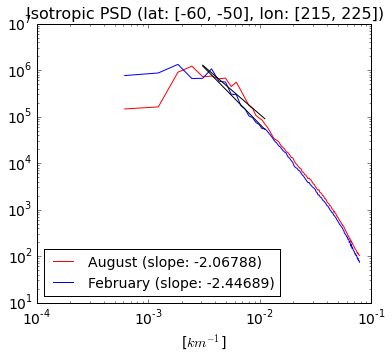

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


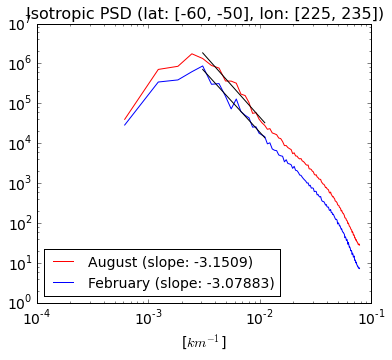

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


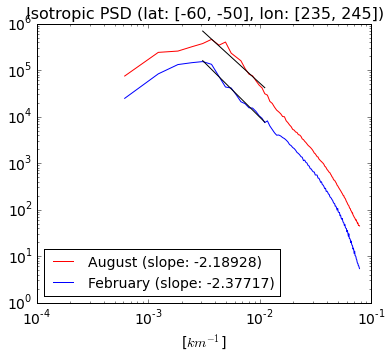

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


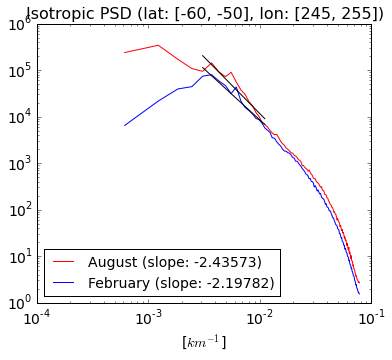

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


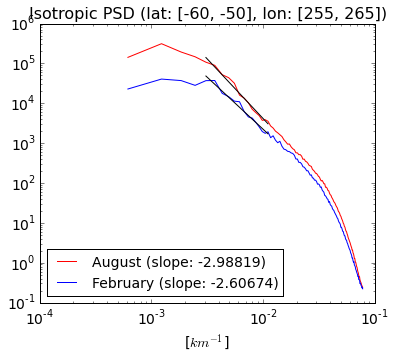

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


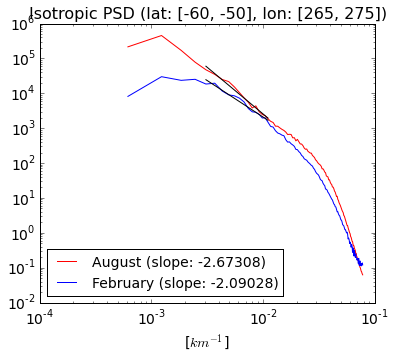

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


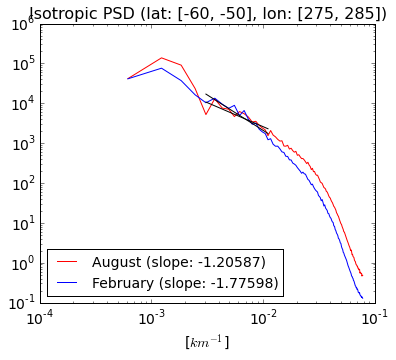

324.704326285 90.1956461904
0.0030797249037 0.0110870096533


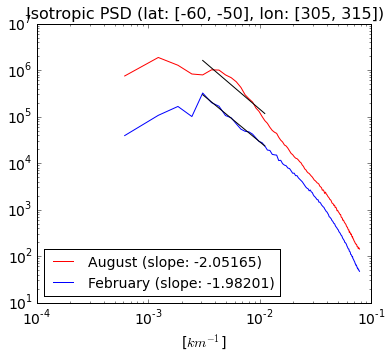

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


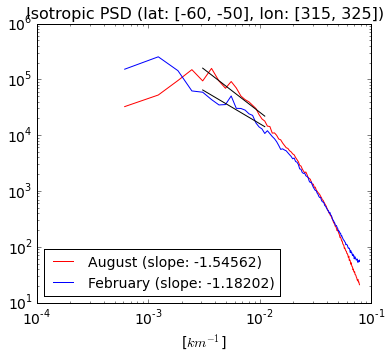

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


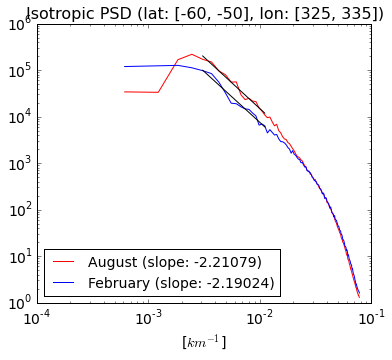

324.704326286 90.1956461904
0.0030797249037 0.0110870096533


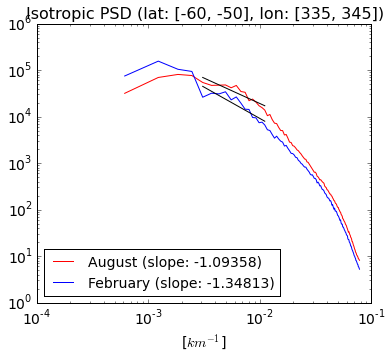

273.434023363 91.1446744542
0.00365718935669 0.0109715680701


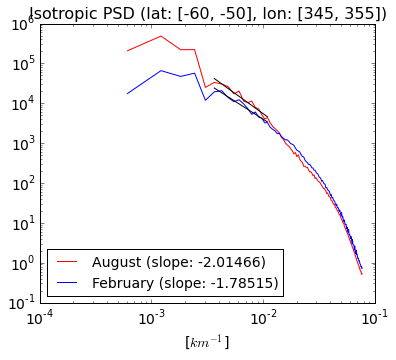

286.857830308 91.272946007
0.00348604742261 0.0109561490425


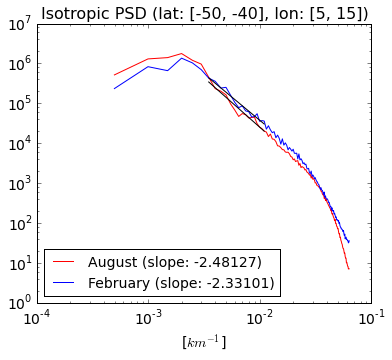

286.857830308 91.272946007
0.00348604742261 0.0109561490425


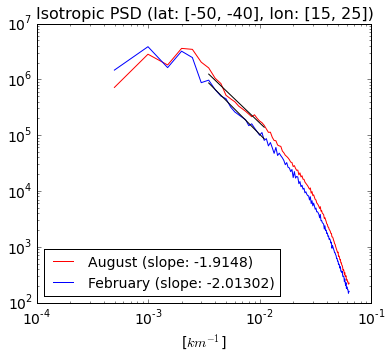

286.857830308 91.272946007
0.00348604742261 0.0109561490425


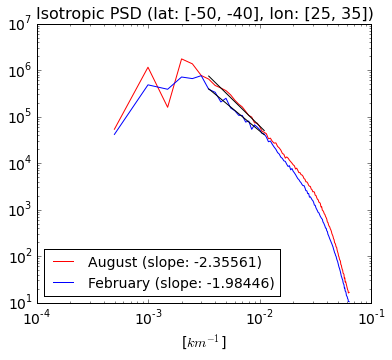

286.857830308 91.272946007
0.00348604742261 0.0109561490425


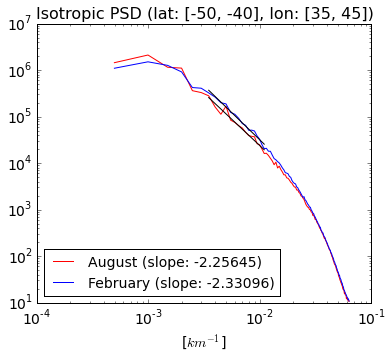

286.857830308 91.272946007
0.00348604742261 0.0109561490425


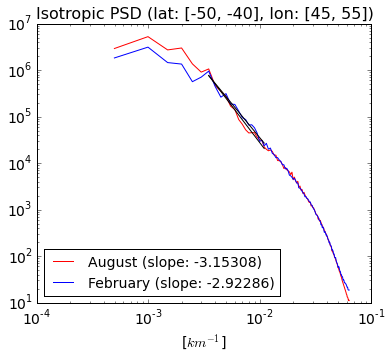

286.857830308 91.272946007
0.00348604742261 0.0109561490425


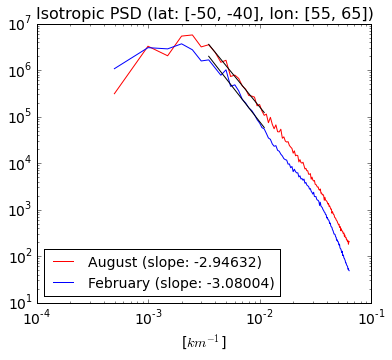

286.857830308 91.272946007
0.00348604742261 0.0109561490425


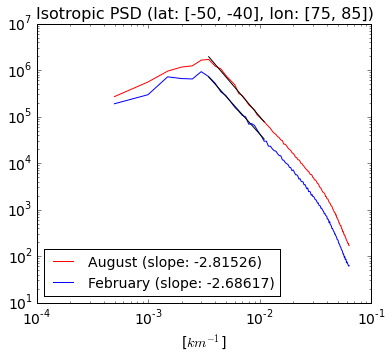

286.857830308 91.272946007
0.00348604742261 0.0109561490425


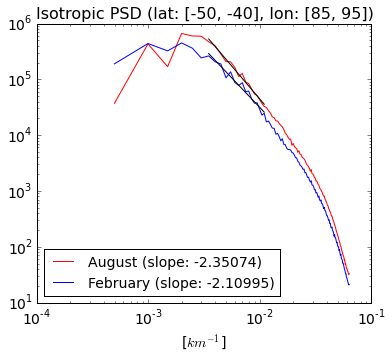

286.857830308 91.272946007
0.00348604742261 0.0109561490425


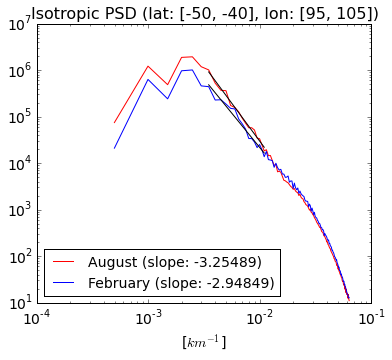

286.857830308 91.272946007
0.00348604742261 0.0109561490425


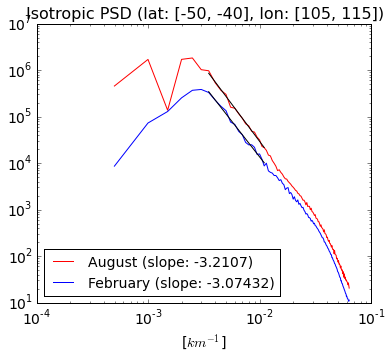

286.857830308 91.272946007
0.00348604742261 0.0109561490425


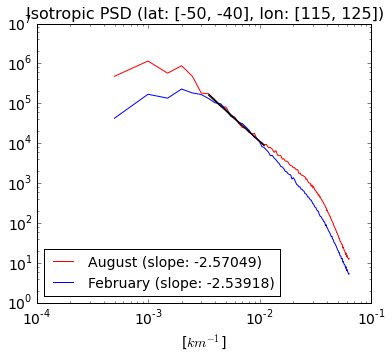

286.857830308 91.272946007
0.00348604742261 0.0109561490425


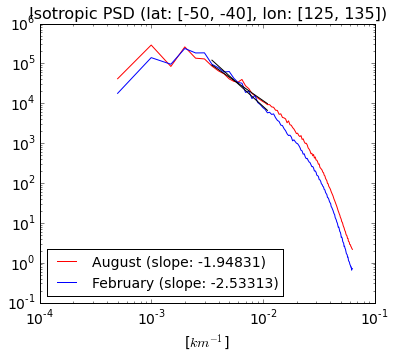

286.857830308 91.272946007
0.00348604742261 0.0109561490425


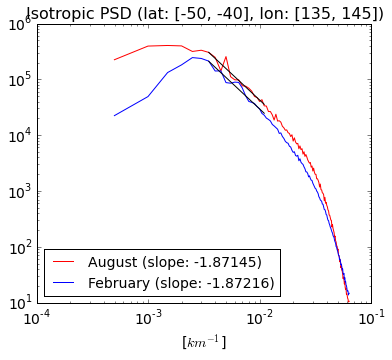

286.857830308 91.272946007
0.00348604742261 0.0109561490425


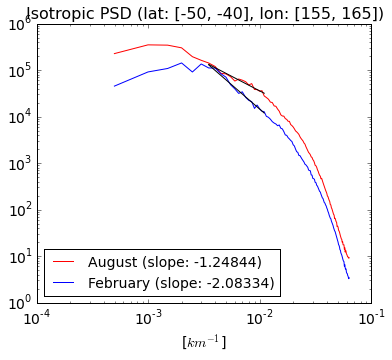

286.857830308 91.272946007
0.00348604742261 0.0109561490425


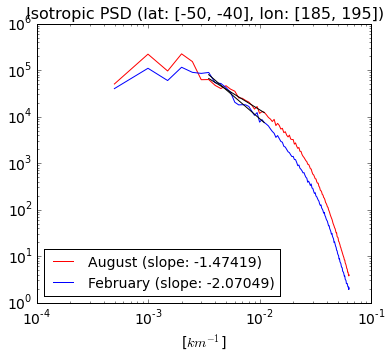

286.857830308 91.272946007
0.00348604742261 0.0109561490425


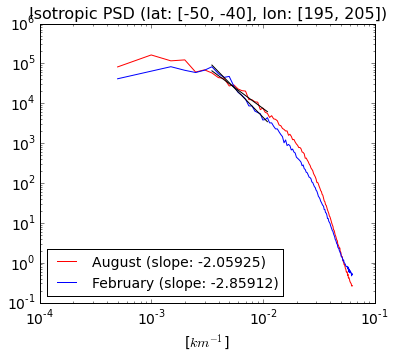

286.857830308 91.272946007
0.00348604742261 0.0109561490425


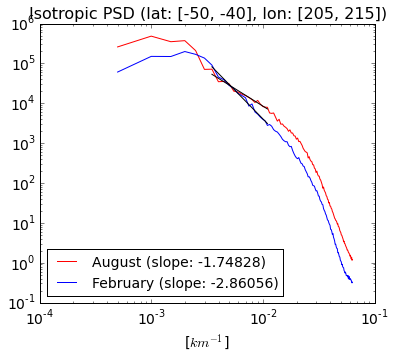

286.857830308 91.272946007
0.00348604742261 0.0109561490425


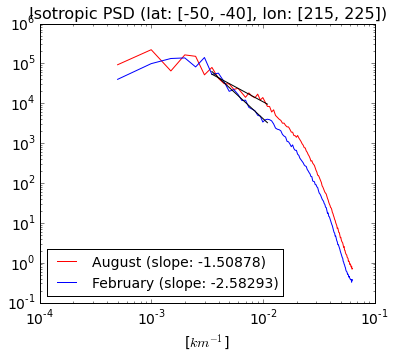

286.857830308 91.272946007
0.00348604742261 0.0109561490425


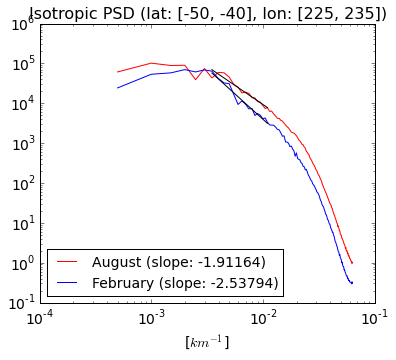

286.857830308 91.272946007
0.00348604742261 0.0109561490425


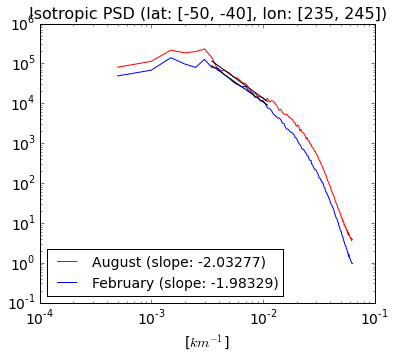

286.857830308 91.272946007
0.00348604742261 0.0109561490425


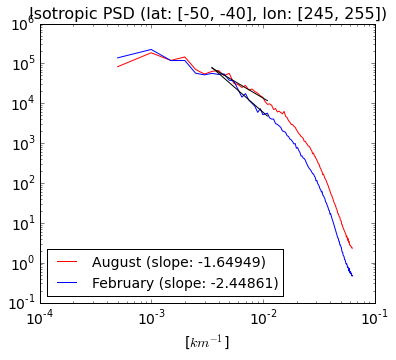

286.857830308 91.272946007
0.00348604742261 0.0109561490425


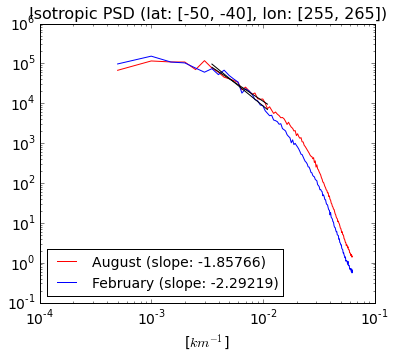

286.857830308 91.272946007
0.00348604742261 0.0109561490425


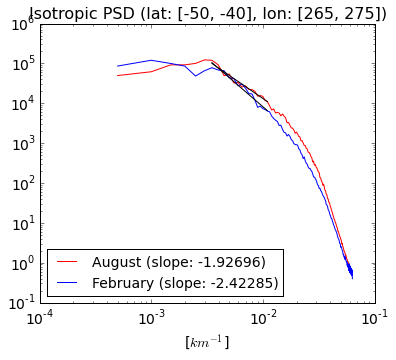

286.857830308 91.272946007
0.00348604742261 0.0109561490425


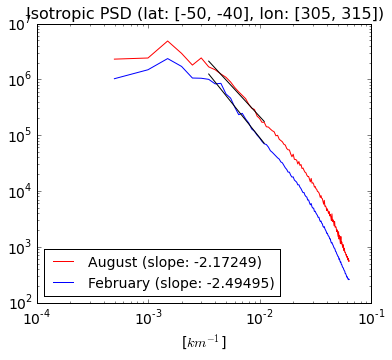

286.857830308 91.272946007
0.00348604742261 0.0109561490425


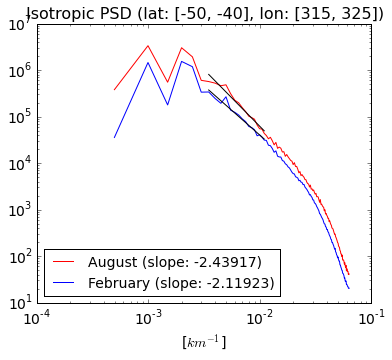

286.857830308 91.272946007
0.00348604742261 0.0109561490425


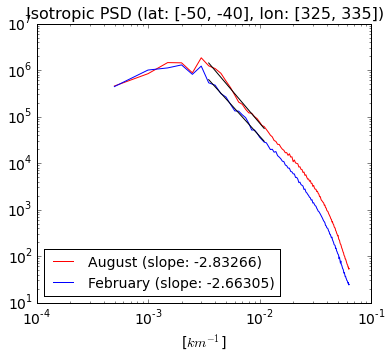

286.857830308 91.272946007
0.00348604742261 0.0109561490425


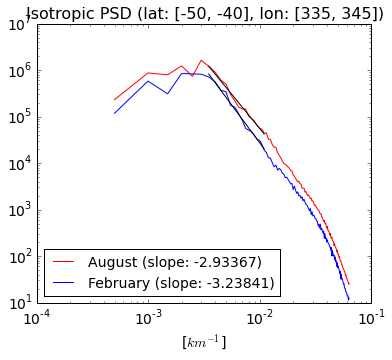

289.876115559 88.223165605
0.00344974955274 0.0113348913876


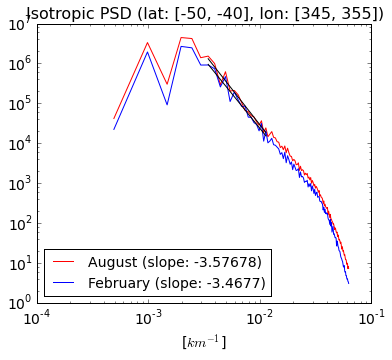

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


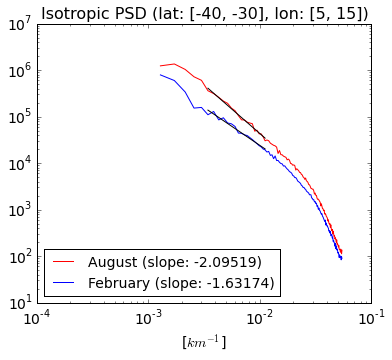

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


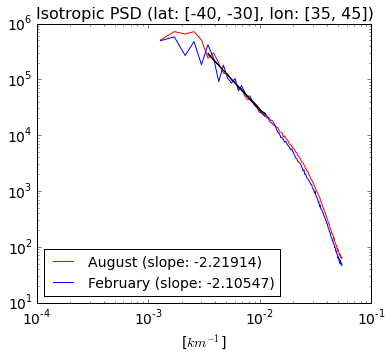

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


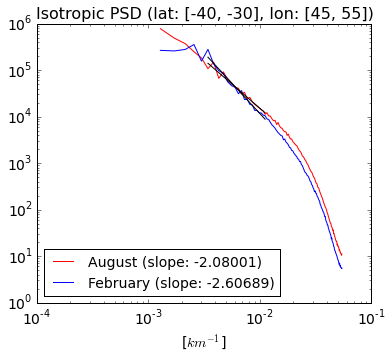

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


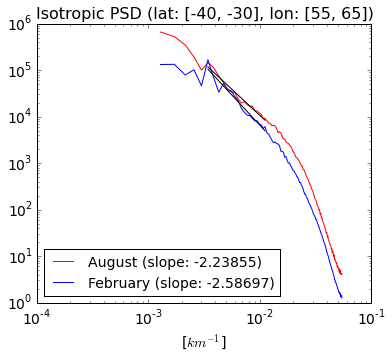

291.354151127 89.6474311159
0.00343224902111 0.0111548093186


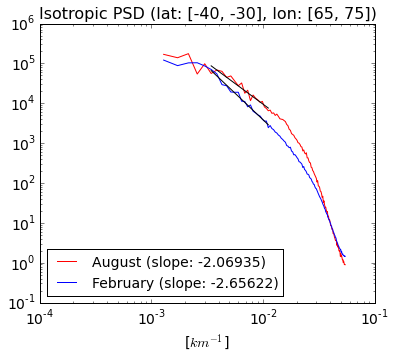

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


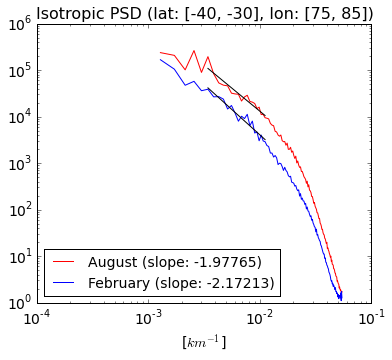

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


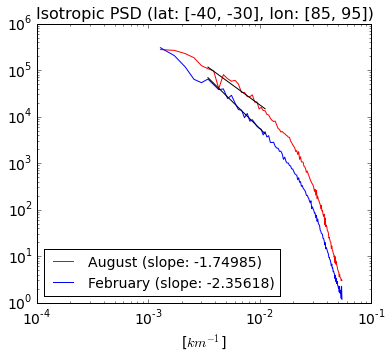

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


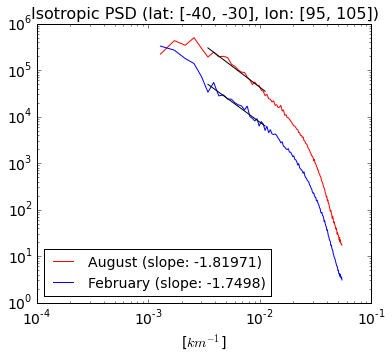

291.354151127 89.6474311159
0.00343224902111 0.0111548093186


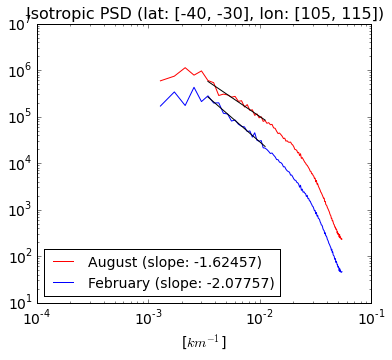

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


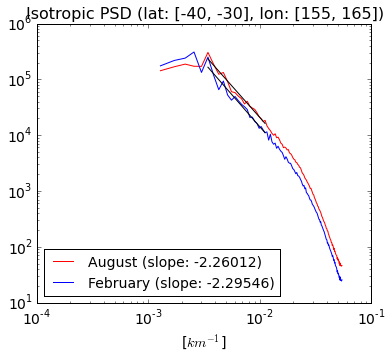

291.354151127 89.6474311159
0.00343224902111 0.0111548093186


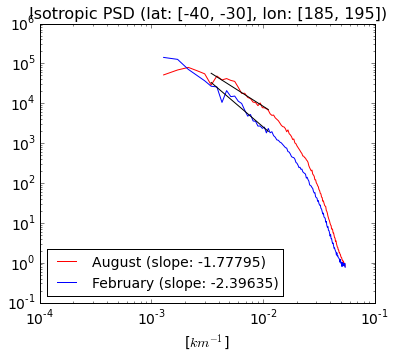

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


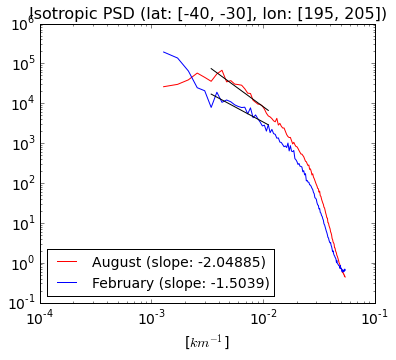

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


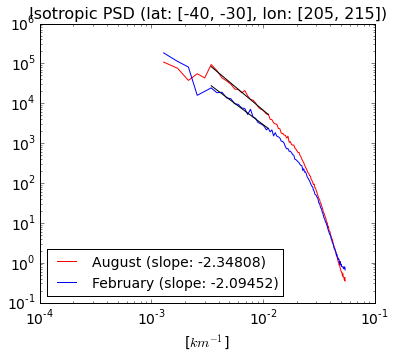

291.354151127 89.6474311159
0.00343224902111 0.0111548093186


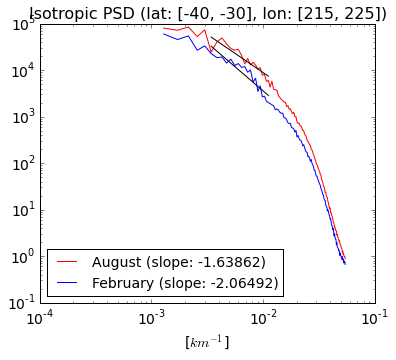

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


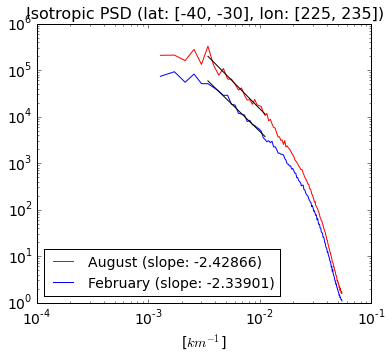

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


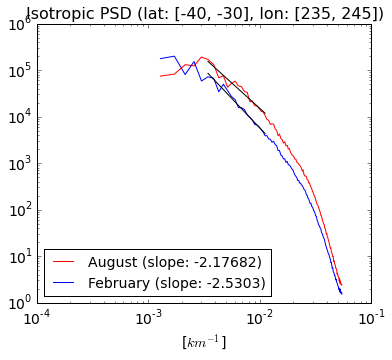

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


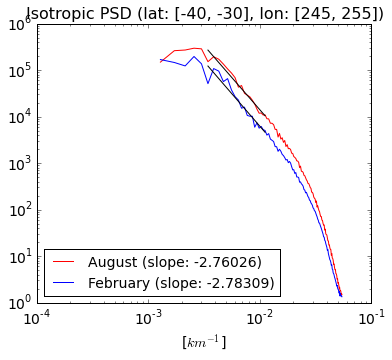

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


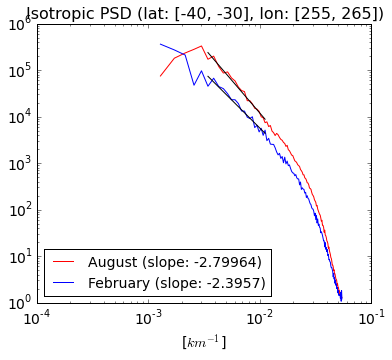

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


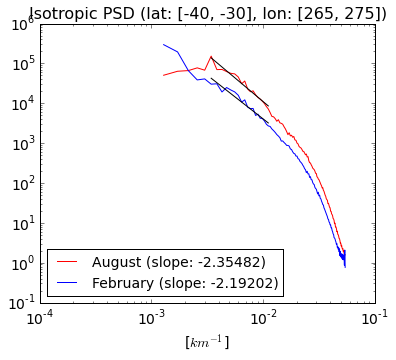

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


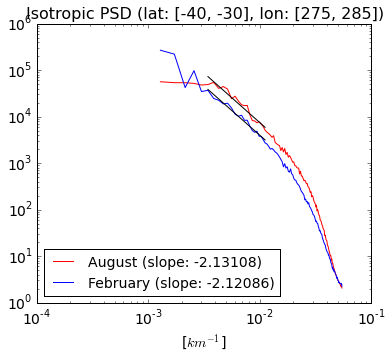

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


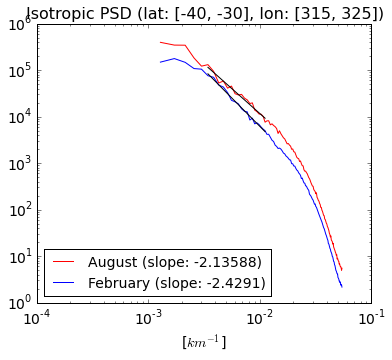

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


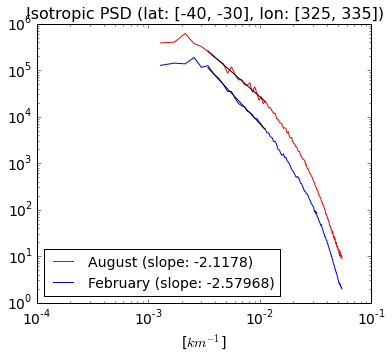

291.354151126 89.6474311158
0.00343224902111 0.0111548093186


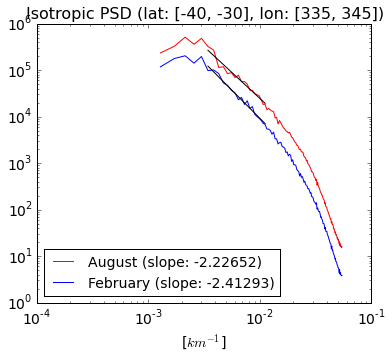

294.419746151 90.5906911234
0.00339651131785 0.011038661783


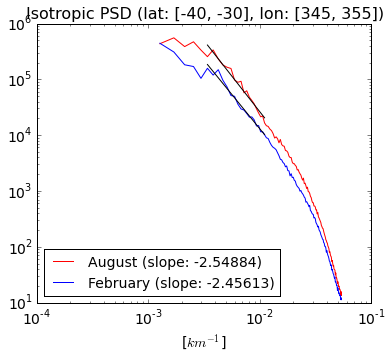

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


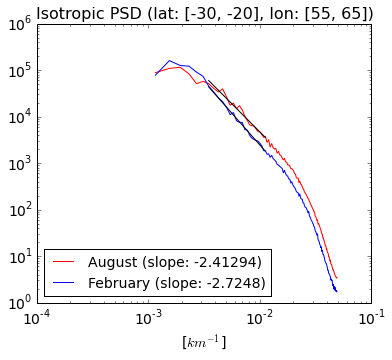

287.01332507 89.0731008839
0.00348415879212 0.0112267338857


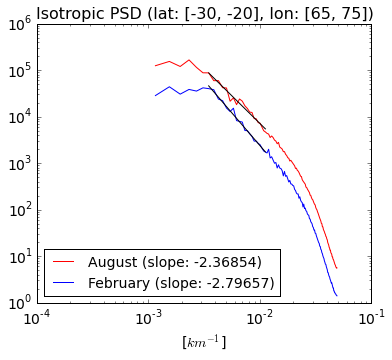

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


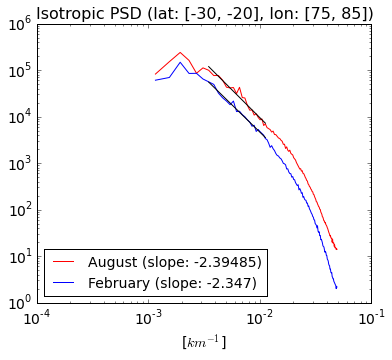

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


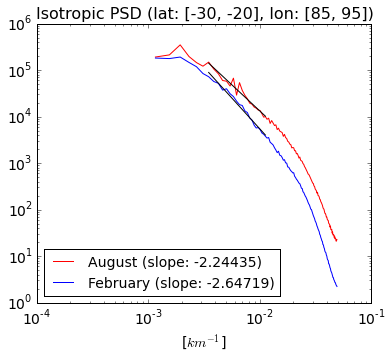

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


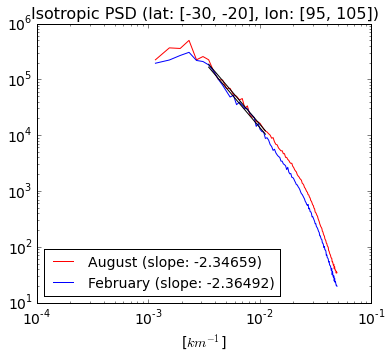

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


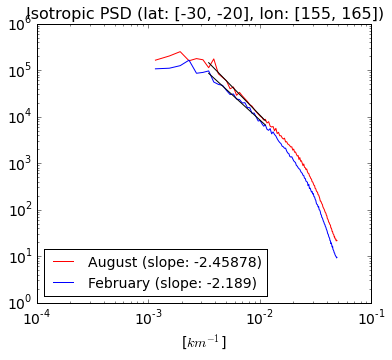

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


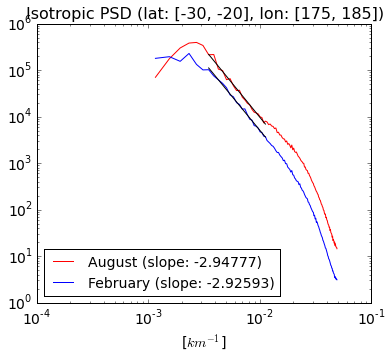

287.01332507 89.0731008839
0.00348415879212 0.0112267338857


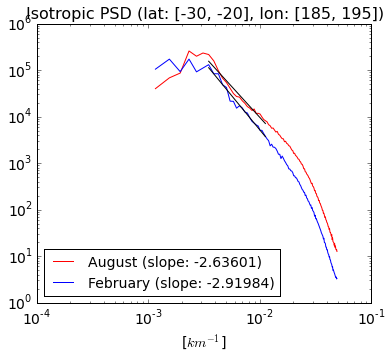

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


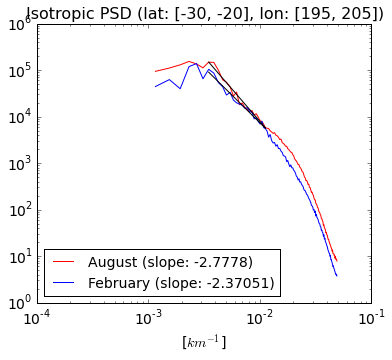

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


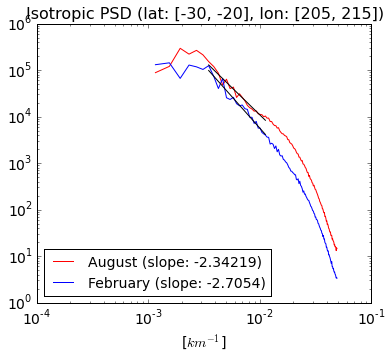

287.01332507 89.0731008839
0.00348415879212 0.0112267338857


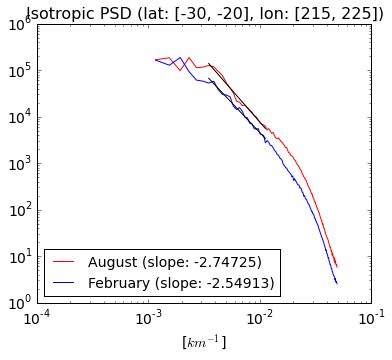

287.01332507 89.0731008838
0.00348415879213 0.0112267338857


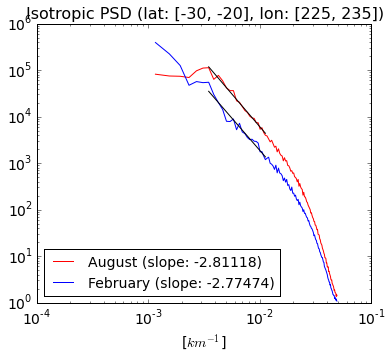

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


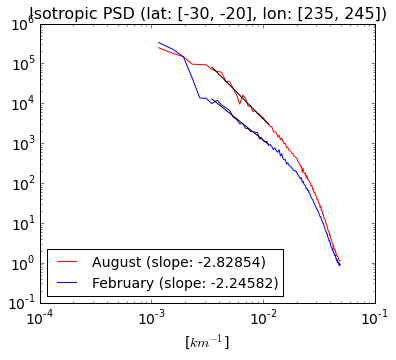

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


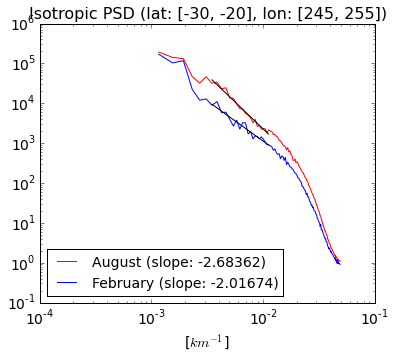

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


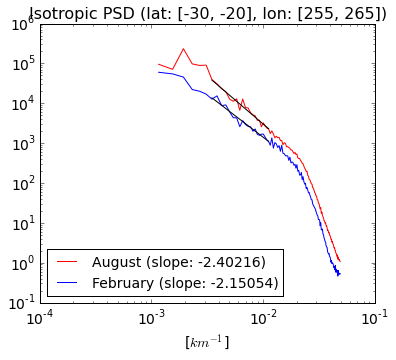

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


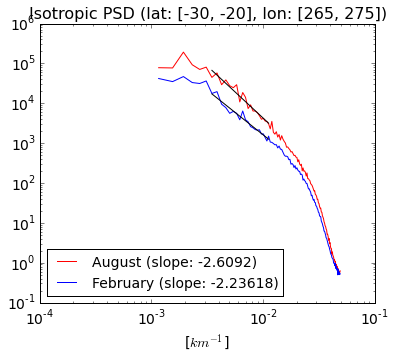

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


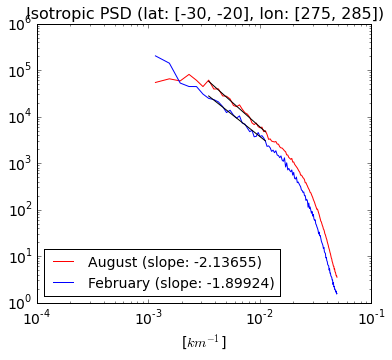

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


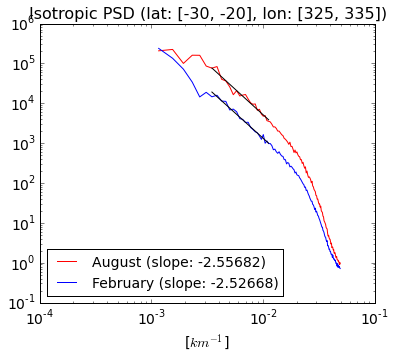

287.01332507 89.0731008838
0.00348415879212 0.0112267338857


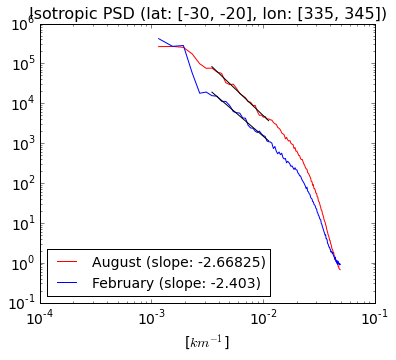

290.03324642 90.0103178544
0.00344788058729 0.0111098374479


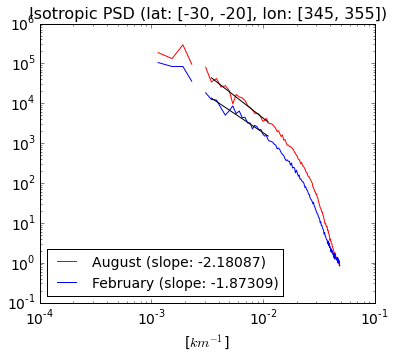

306.061384611 88.856531016
0.00326731842134 0.0112540967846


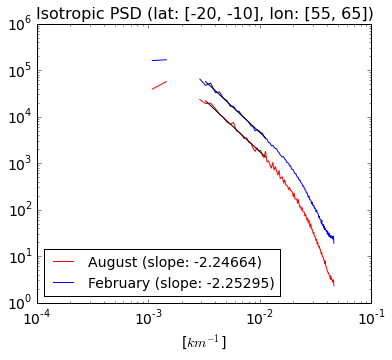

306.061384611 88.856531016
0.00326731842134 0.0112540967846


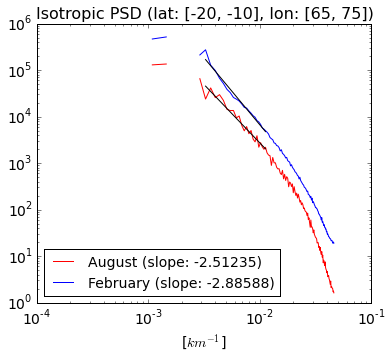

306.061384611 88.856531016
0.00326731842134 0.0112540967846


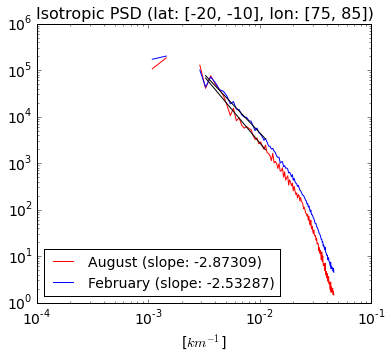

306.061384611 88.856531016
0.00326731842134 0.0112540967846


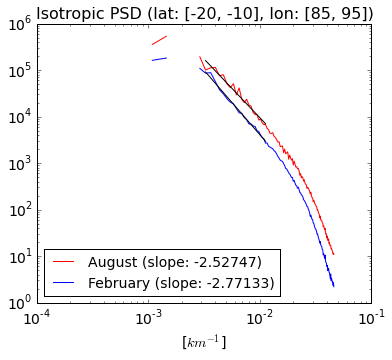

306.061384611 88.856531016
0.00326731842134 0.0112540967846


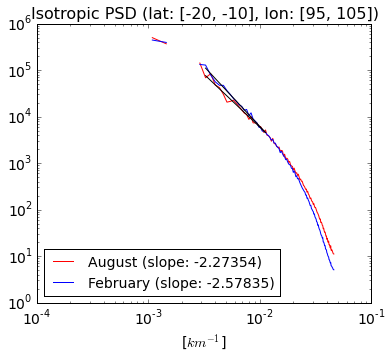

306.061384611 88.856531016
0.00326731842134 0.0112540967846


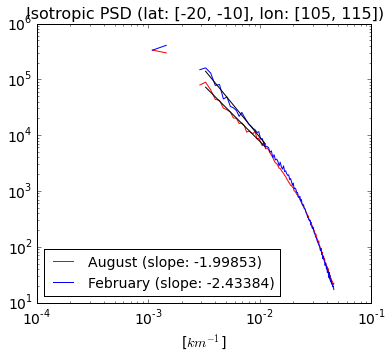

306.061384611 88.856531016
0.00326731842134 0.0112540967846


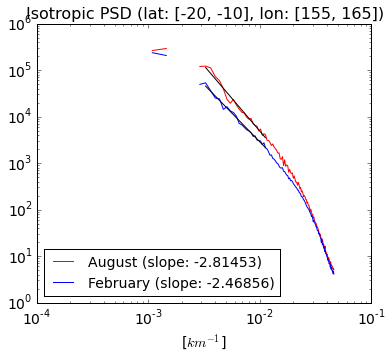

306.061384611 88.856531016
0.00326731842134 0.0112540967846


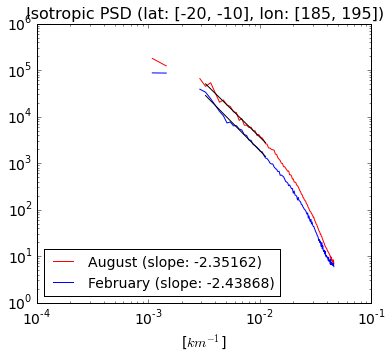

306.061384611 88.856531016
0.00326731842134 0.0112540967846


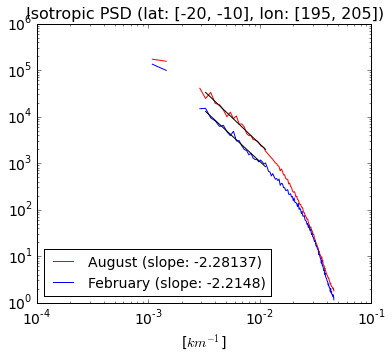

306.061384611 88.856531016
0.00326731842134 0.0112540967846


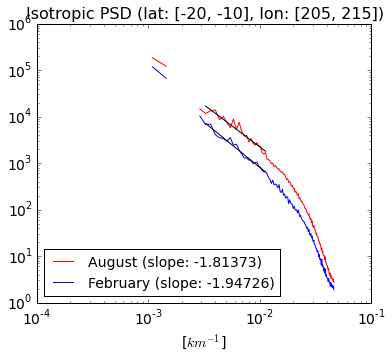

306.061384611 88.856531016
0.00326731842134 0.0112540967846


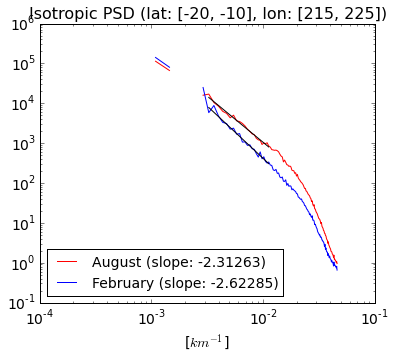

306.06138461 88.8565310159
0.00326731842134 0.0112540967846


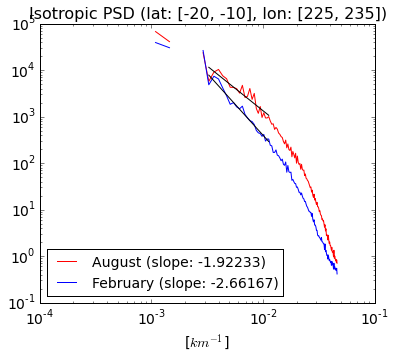

306.061384611 88.856531016
0.00326731842134 0.0112540967846


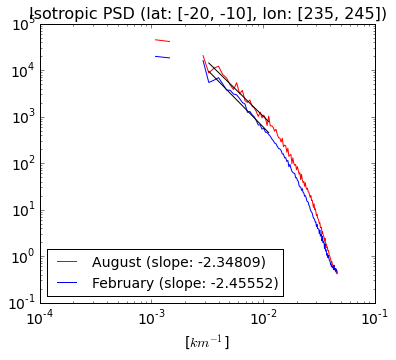

306.061384611 88.856531016
0.00326731842134 0.0112540967846


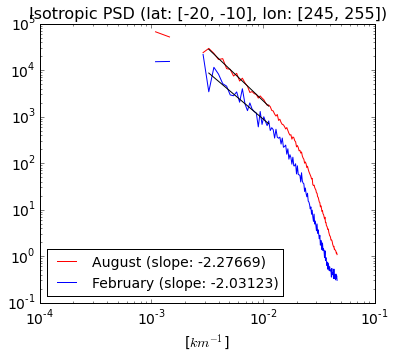

306.061384611 88.856531016
0.00326731842134 0.0112540967846


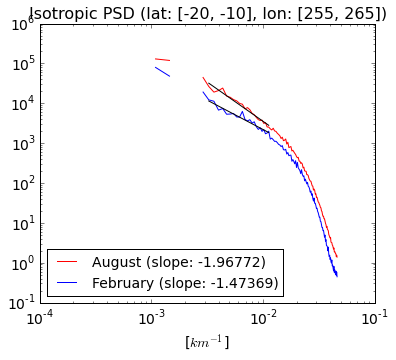

306.061384611 88.856531016
0.00326731842134 0.0112540967846


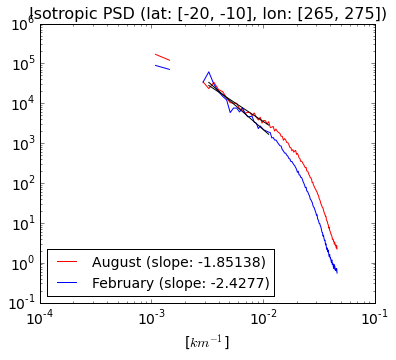

306.061384611 88.856531016
0.00326731842134 0.0112540967846


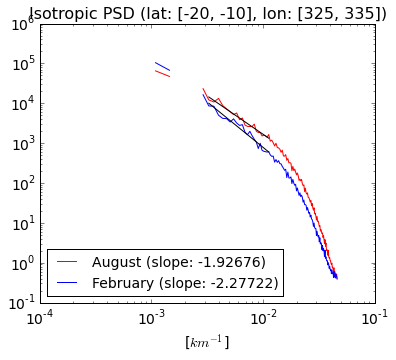

306.061384611 88.856531016
0.00326731842134 0.0112540967846


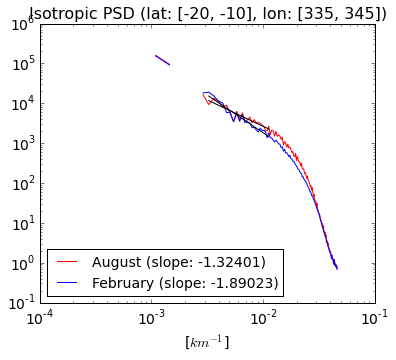

309.281727462 89.7914692632
0.00323329802962 0.0111369154353


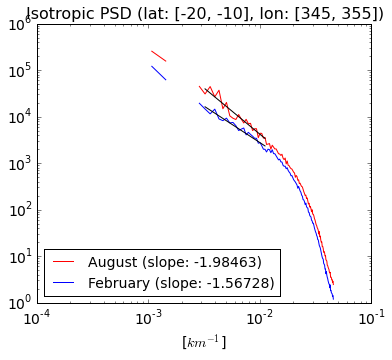

315.741817657 88.802386216
0.00316714462285 0.011260958659


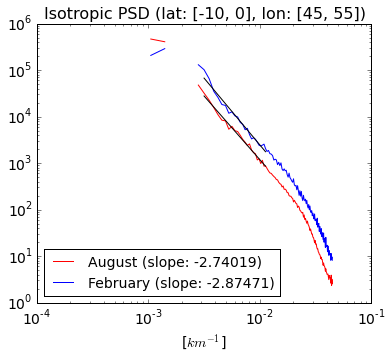

315.741817657 88.802386216
0.00316714462285 0.011260958659


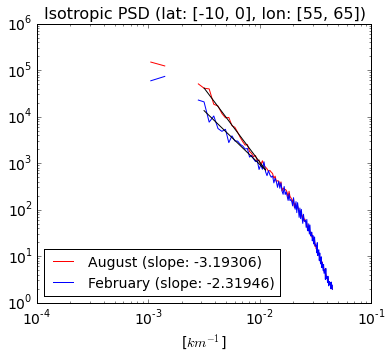

315.741817657 88.802386216
0.00316714462285 0.011260958659


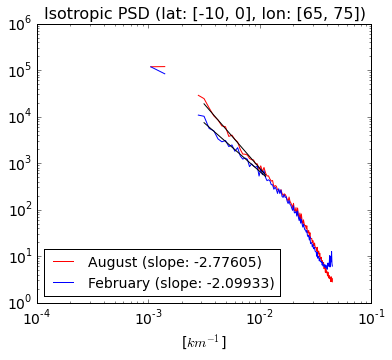

315.741817657 88.802386216
0.00316714462285 0.011260958659


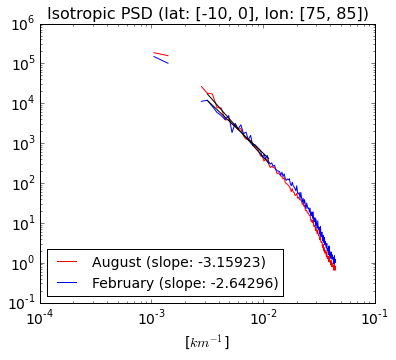

315.741817657 88.802386216
0.00316714462285 0.011260958659


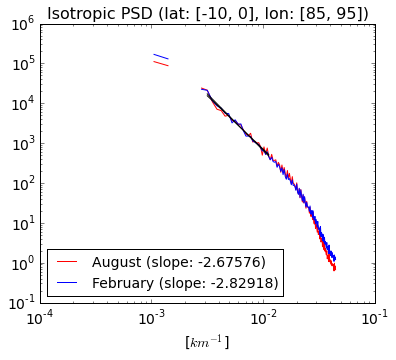

315.741817657 88.802386216
0.00316714462285 0.011260958659


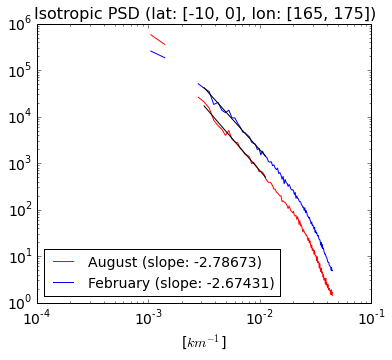

315.741817657 88.802386216
0.00316714462285 0.011260958659


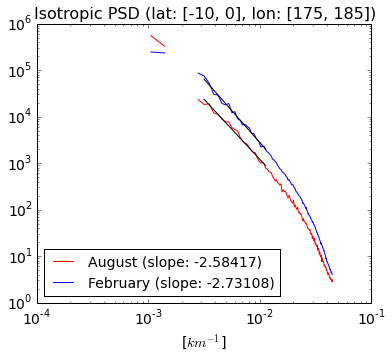

315.741817657 88.802386216
0.00316714462285 0.011260958659


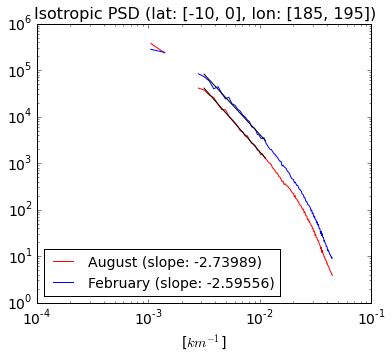

315.741817657 88.802386216
0.00316714462285 0.011260958659


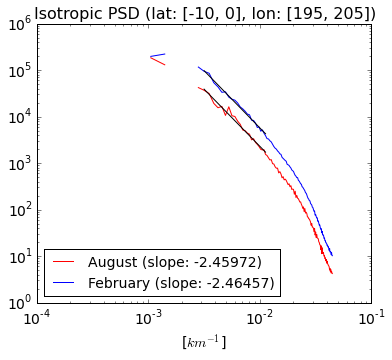

315.741817657 88.802386216
0.00316714462285 0.011260958659


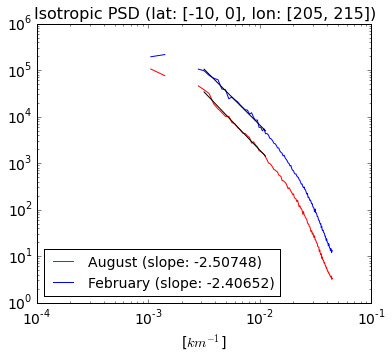

315.741817657 88.802386216
0.00316714462285 0.011260958659


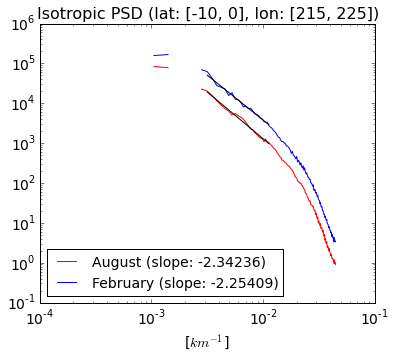

315.741817657 88.8023862159
0.00316714462285 0.011260958659


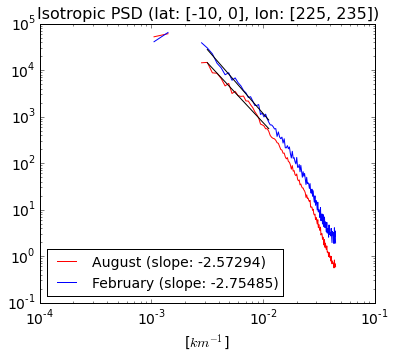

315.741817657 88.802386216
0.00316714462285 0.011260958659


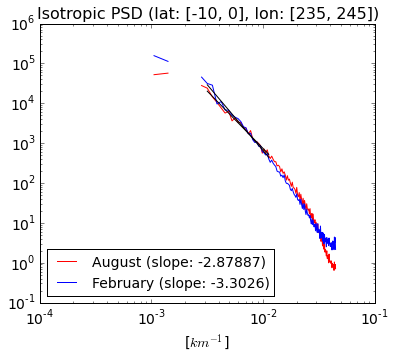

315.741817657 88.802386216
0.00316714462285 0.011260958659


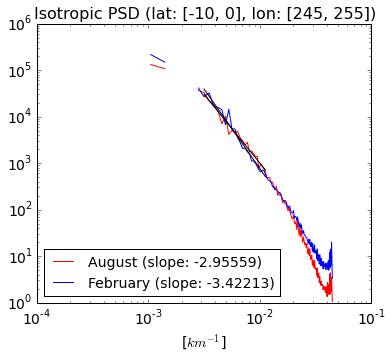

315.741817657 88.802386216
0.00316714462285 0.011260958659


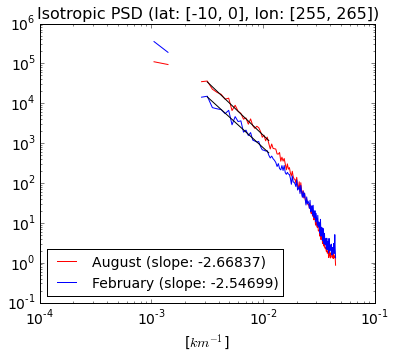

315.741817657 88.802386216
0.00316714462285 0.011260958659


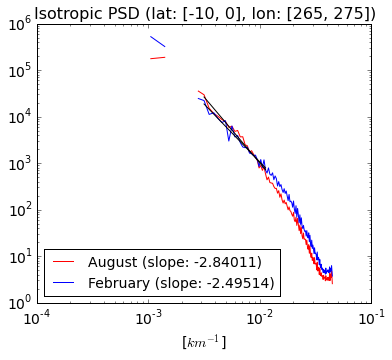

315.741817657 88.802386216
0.00316714462285 0.011260958659


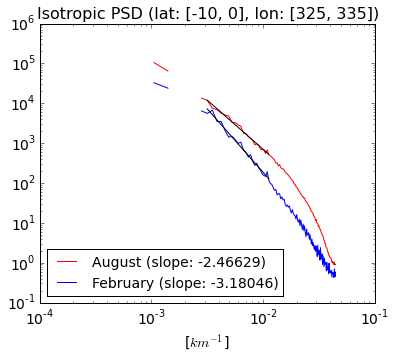

315.741817657 88.802386216
0.00316714462285 0.011260958659


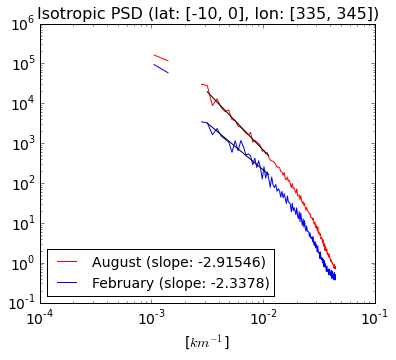

287.157615225 89.7367547578
0.00348240808177 0.0111437058617


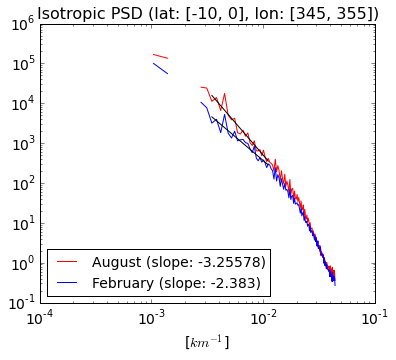

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


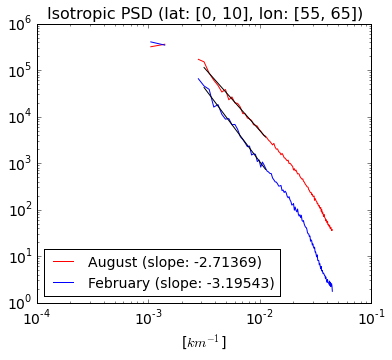

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


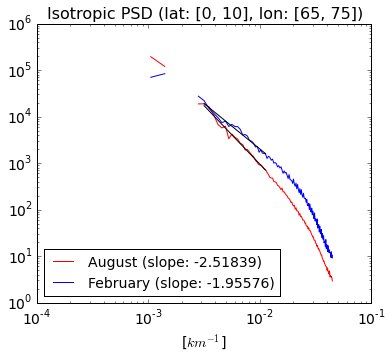

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


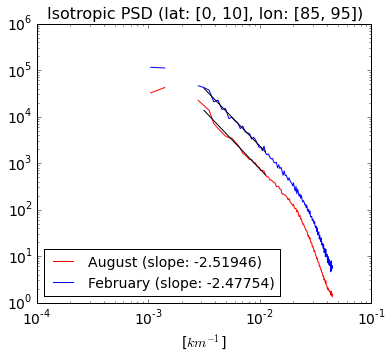

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


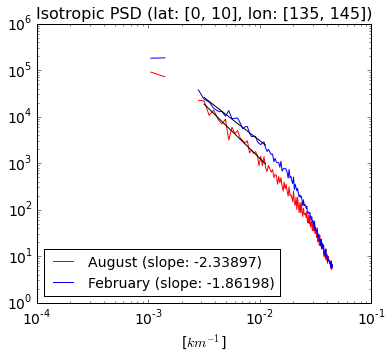

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


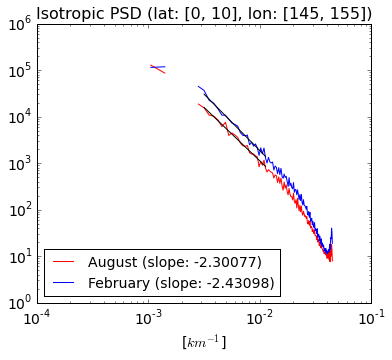

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


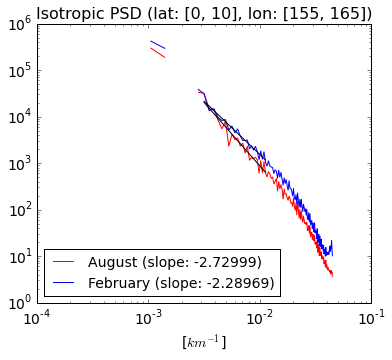

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


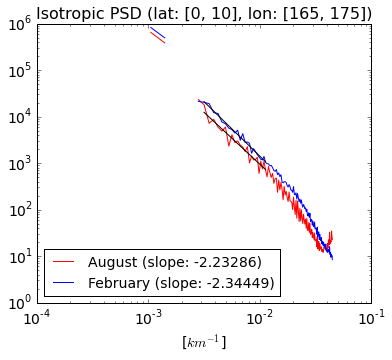

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


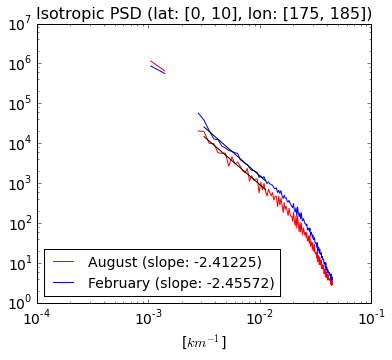

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


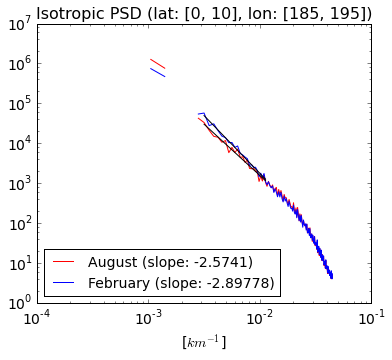

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


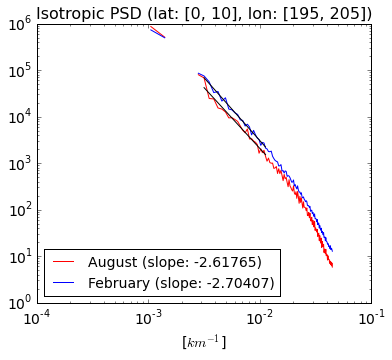

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


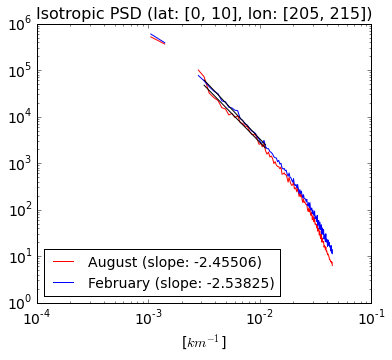

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


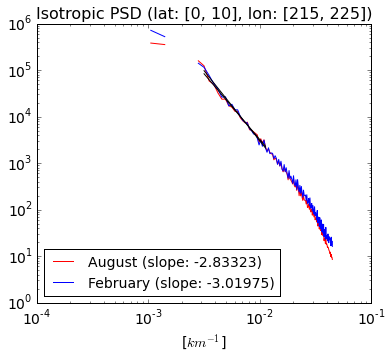

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


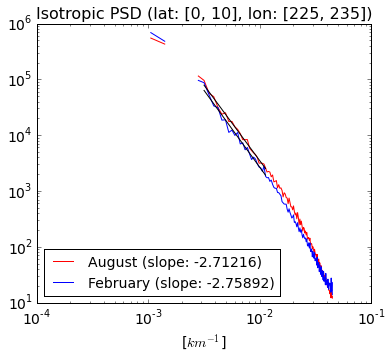

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


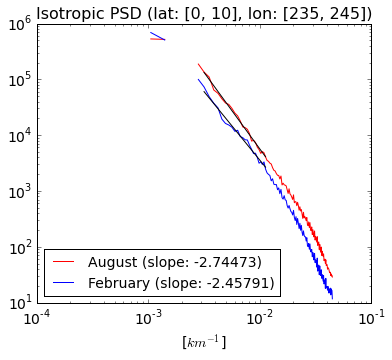

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


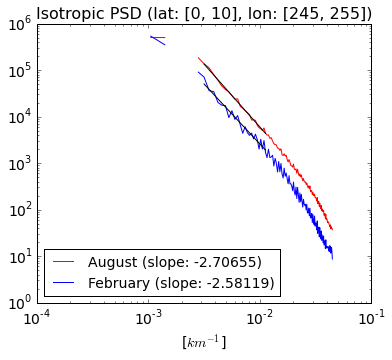

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


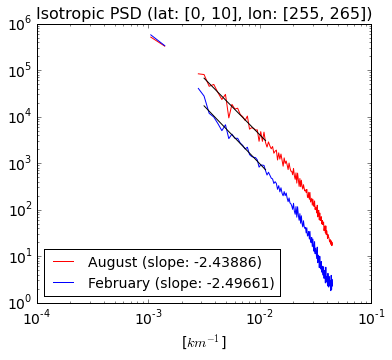

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


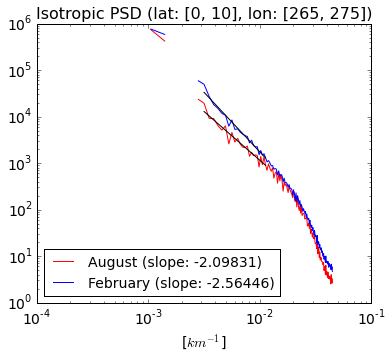

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


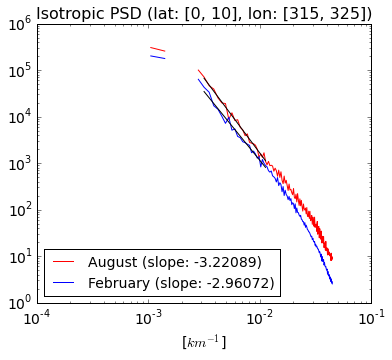

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


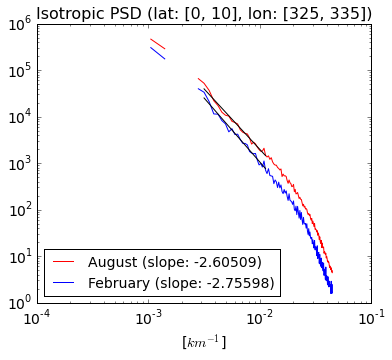

315.741817346 88.8023861284
0.00316714462597 0.0112609586701


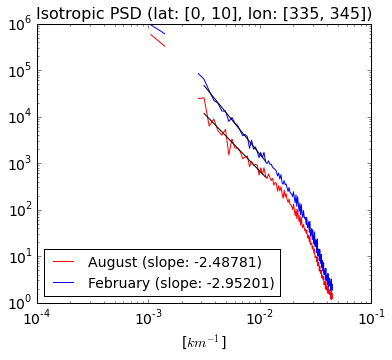

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


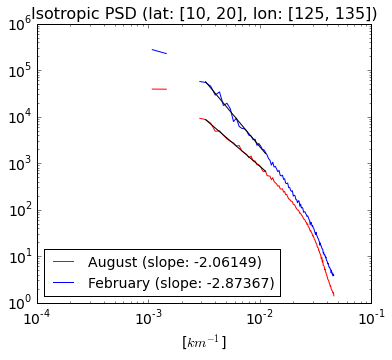

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


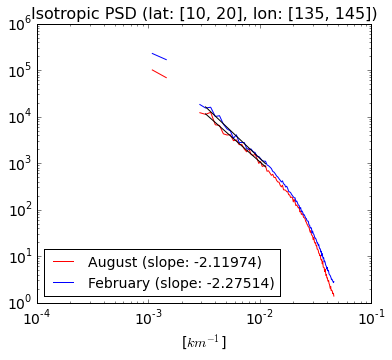

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


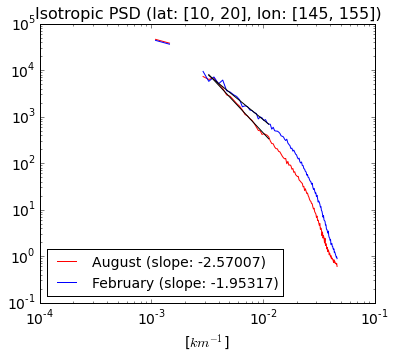

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


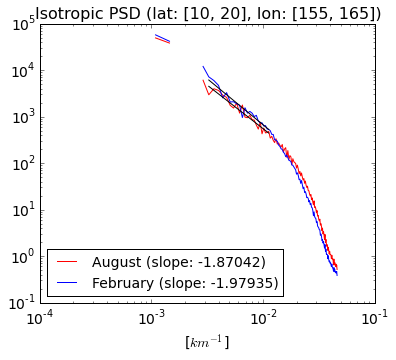

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


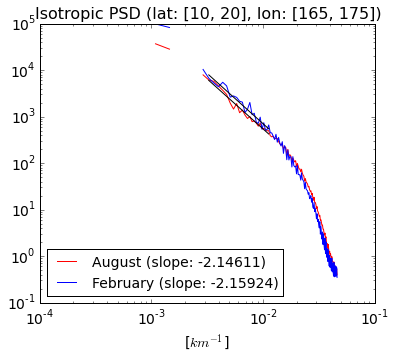

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


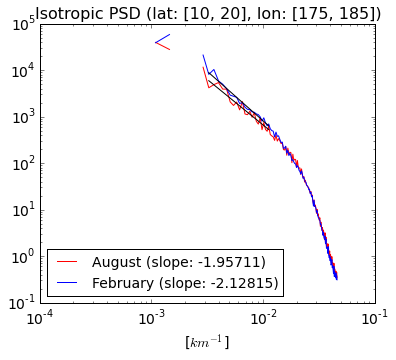

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


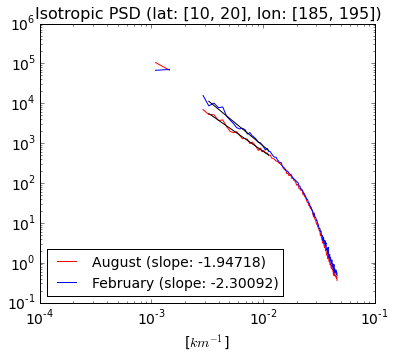

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


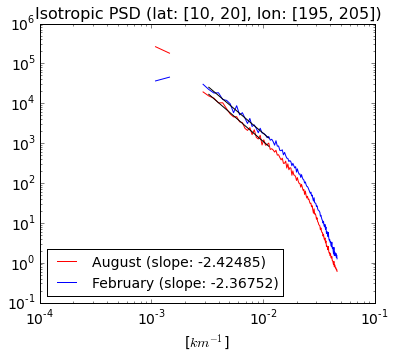

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


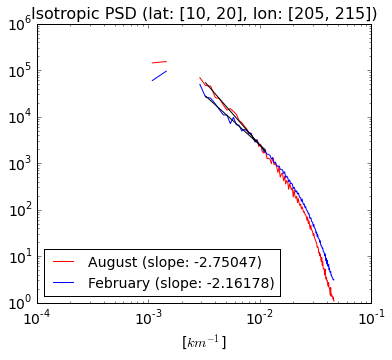

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


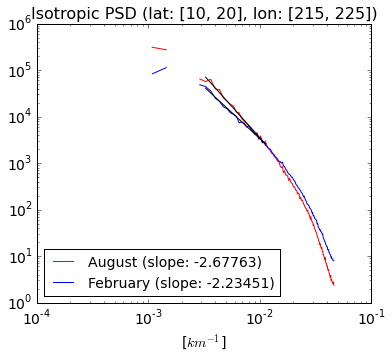

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


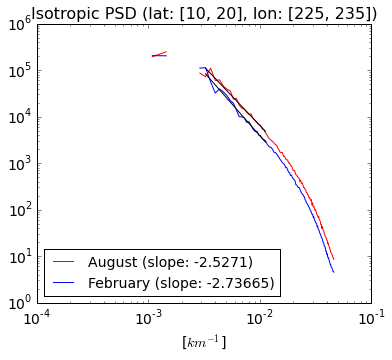

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


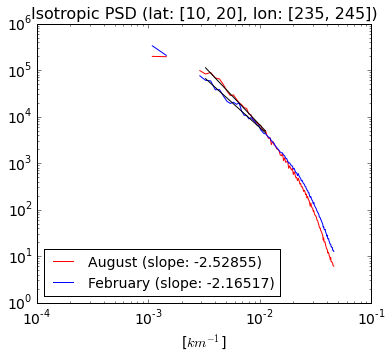

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


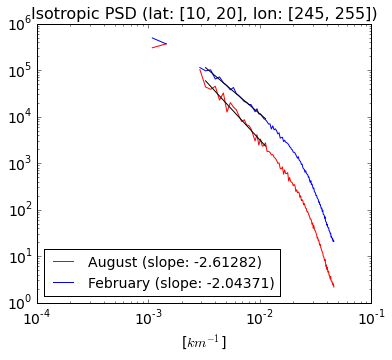

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


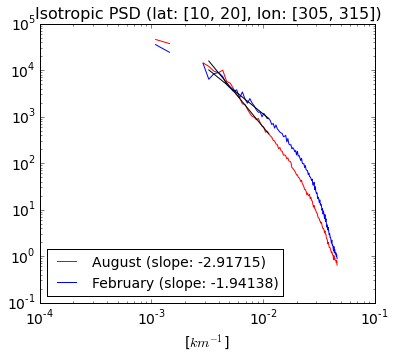

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


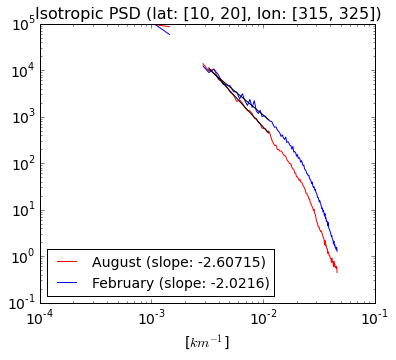

306.061381985 88.8565302538
0.00326731844937 0.0112540968812


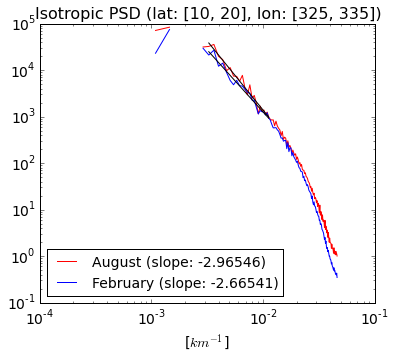

287.225693086 89.1390081991
0.00348158268592 0.0112184330991


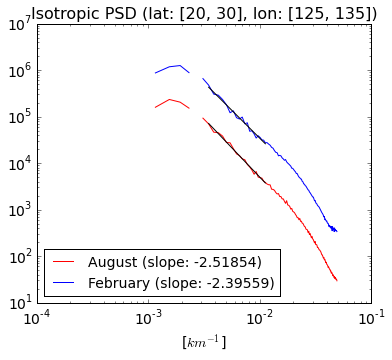

287.225693086 89.1390081991
0.00348158268592 0.0112184330991


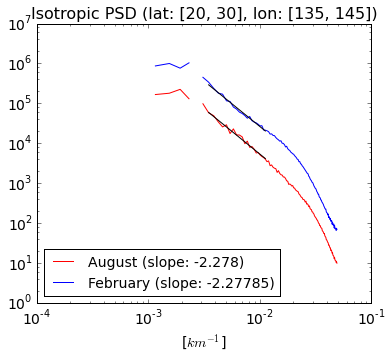

287.225693086 89.1390081991
0.00348158268592 0.0112184330991


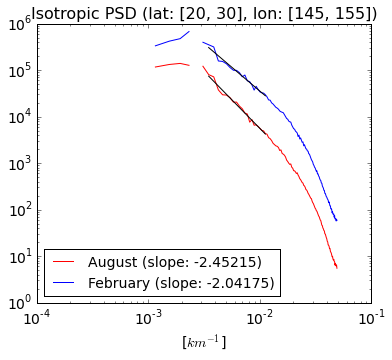

287.437505042 89.204742944
0.00347901711662 0.0112101662647


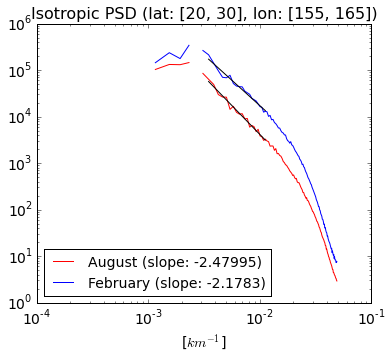

287.225693086 89.1390081991
0.00348158268592 0.0112184330991


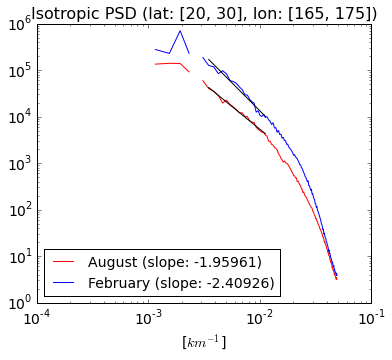

287.225693086 89.1390081991
0.00348158268592 0.0112184330991


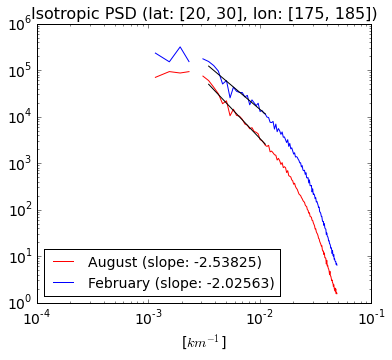

287.225693086 89.1390081991
0.00348158268592 0.0112184330991


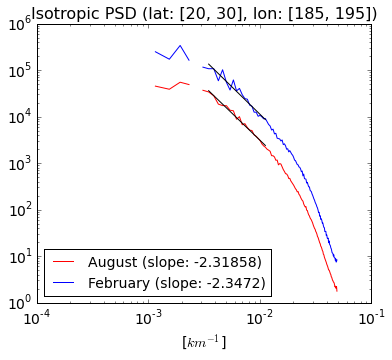

287.013318514 89.0730988493
0.00348415887171 0.0112267341422


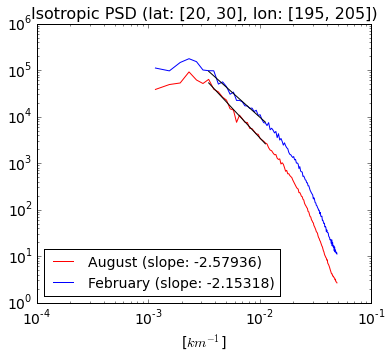

287.013318514 89.0730988493
0.00348415887171 0.0112267341422


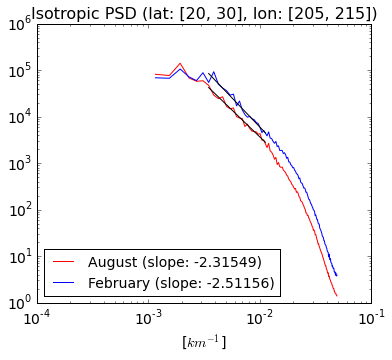

286.80038385 89.0070156775
0.00348674568206 0.01123506942


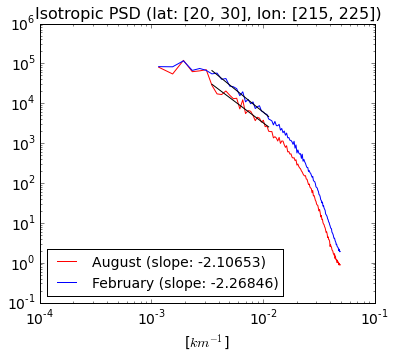

286.80038385 89.0070156775
0.00348674568206 0.01123506942


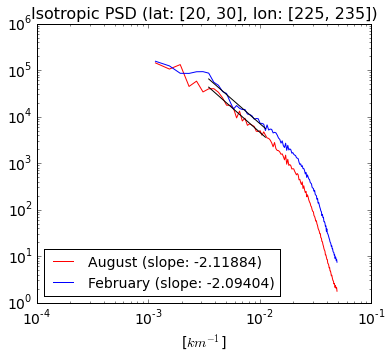

286.80038385 89.0070156775
0.00348674568206 0.01123506942


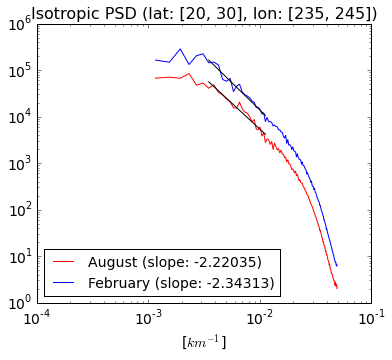

287.013318514 89.0730988493
0.00348415887171 0.0112267341422


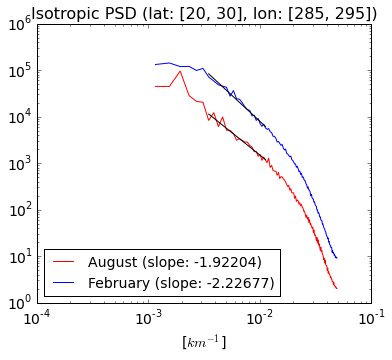

287.013318514 89.0730988493
0.00348415887171 0.0112267341422


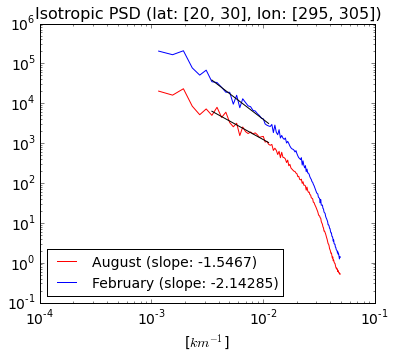

287.225693086 89.1390081991
0.00348158268592 0.0112184330991


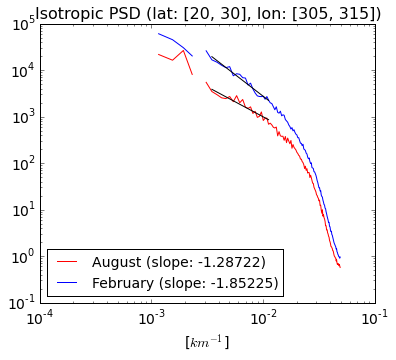

287.225693086 89.1390081991
0.00348158268592 0.0112184330991


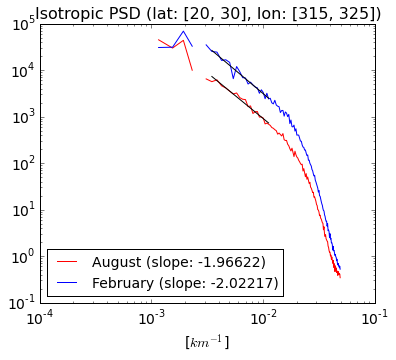

287.225693086 89.1390081991
0.00348158268592 0.0112184330991


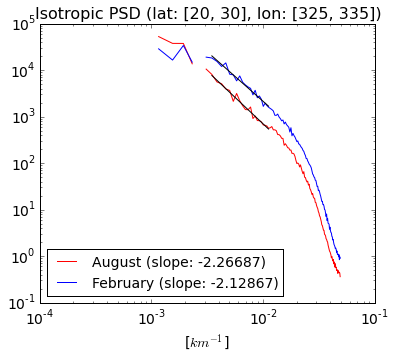

295.923292672 91.0533208221
0.00337925409984 0.0109825758245


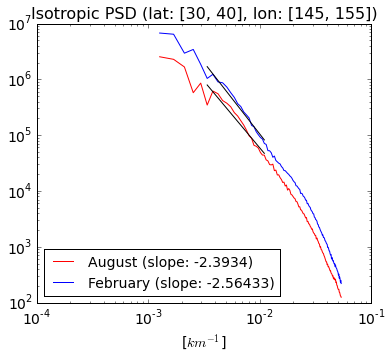

293.152254768 90.2006937748
0.00341119668614 0.01108638923


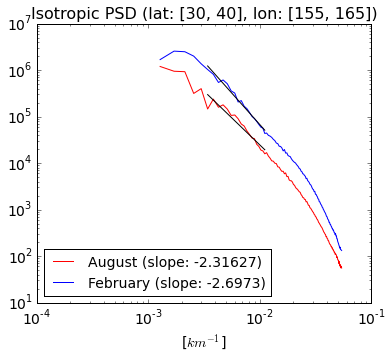

295.923292672 91.0533208221
0.00337925409984 0.0109825758245


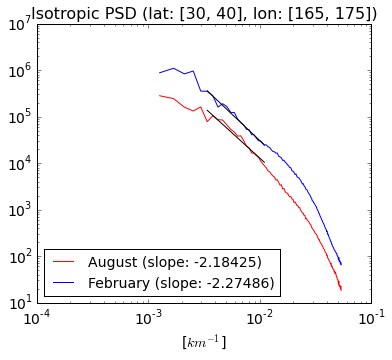

292.340515818 89.950927944
0.00342066852144 0.0111171726947


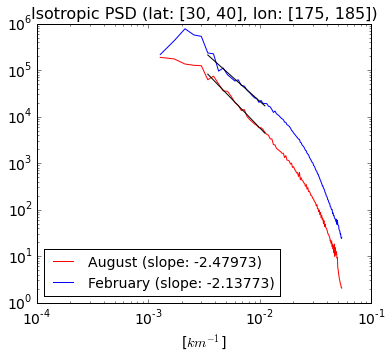

292.219845208 89.9137985257
0.00342208106806 0.0111217634712


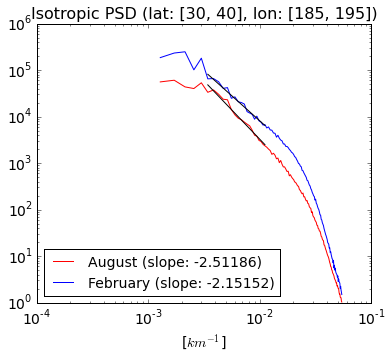

294.280250416 90.5477693588
0.00339812134381 0.0110438943674


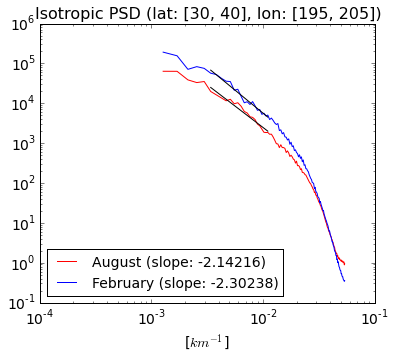

290.996552443 89.5374007515
0.00343646682961 0.0111685171962


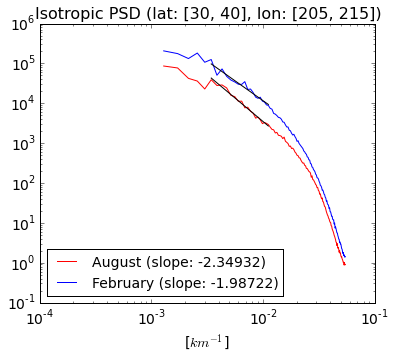

290.004235076 89.2320723311
0.00344822550518 0.0112067328918


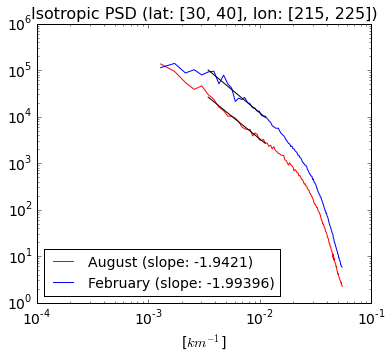

289.1341231 88.9643455692
0.00345860249658 0.0112404581139


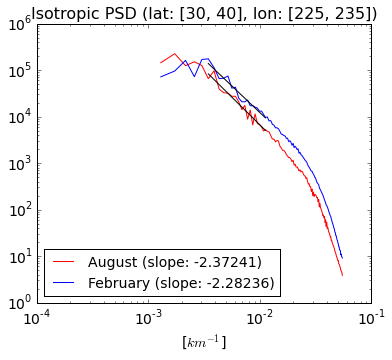

294.280250416 90.5477693588
0.00339812134381 0.0110438943674


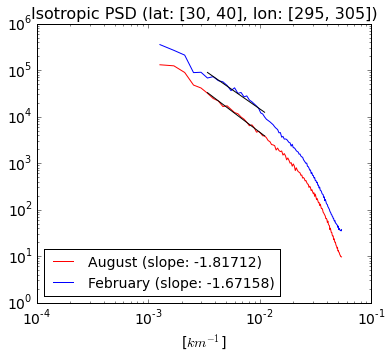

292.225975033 89.9156846255
0.00342200928541 0.0111215301776


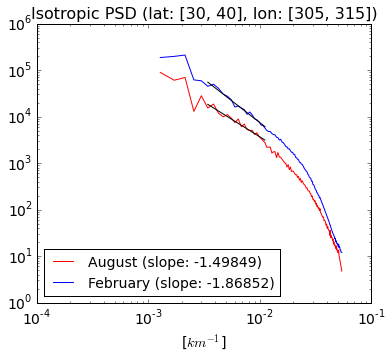

292.34491988 89.95228304
0.0034206169904 0.0111170052188


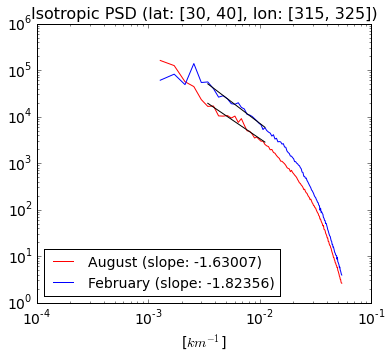

295.923292672 91.0533208221
0.00337925409984 0.0109825758245


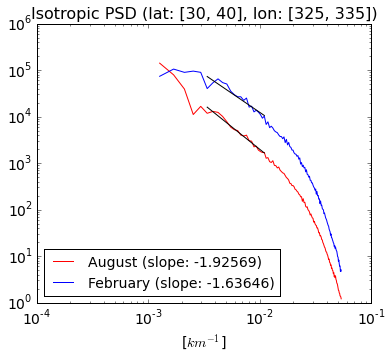

293.152254768 90.2006937748
0.00341119668614 0.01108638923


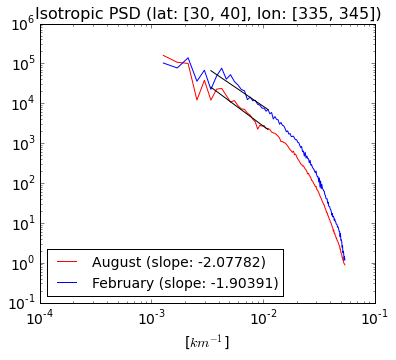

297.157283334 90.4391731885
0.00336522123497 0.0110571554863


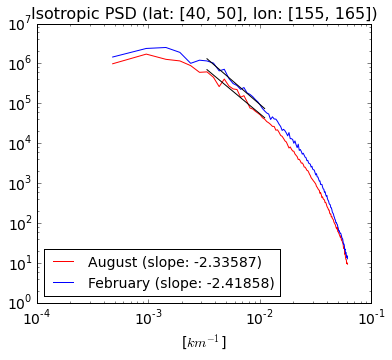

299.608434102 91.1851755963
0.00333768975161 0.0109666948982


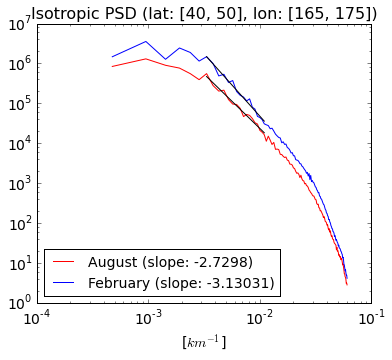

298.523118759 90.8548622309
0.00334982430895 0.0110065655865


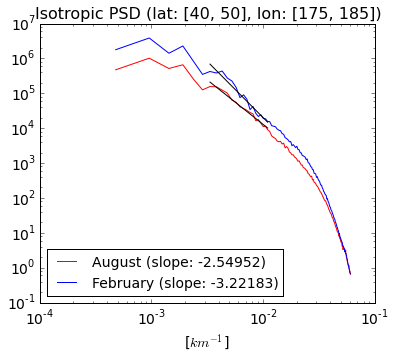

296.338701508 90.1900395894
0.00337451704725 0.0110876988695


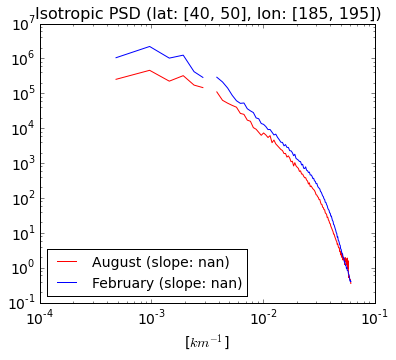

290.816157704 88.5092653881
0.00343859848743 0.011298252173


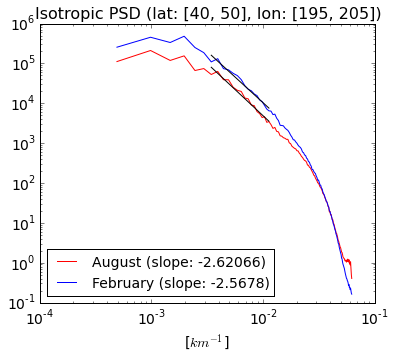

286.421336164 91.1340615069
0.00349136001316 0.0109728457556


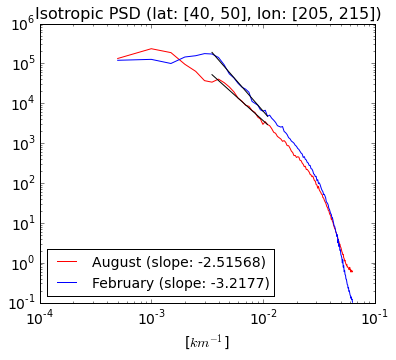

280.57066831 89.2724853714
0.00356416444393 0.0112016596809


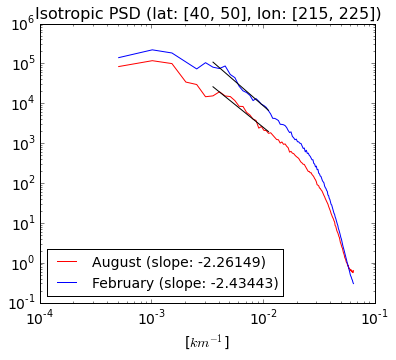

298.523118759 90.8548622309
0.00334982430895 0.0110065655865


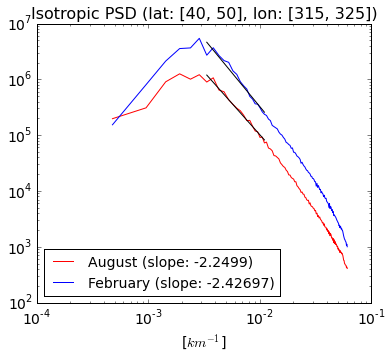

299.608434102 91.1851755963
0.00333768975161 0.0109666948982


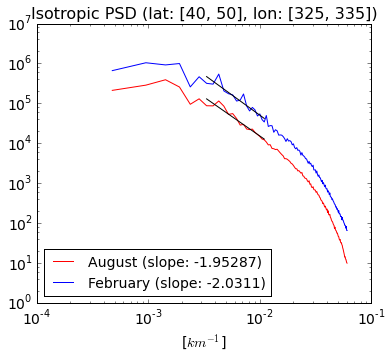

297.157283334 90.4391731885
0.00336522123497 0.0110571554863


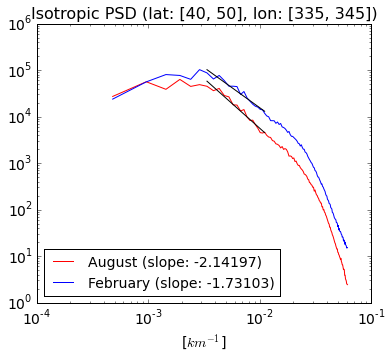

303.839641819 91.1518925456
0.00329120977768 0.0109706992589


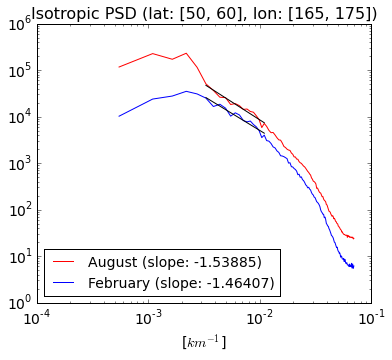

297.862579558 89.3587738674
0.00335725286971 0.011190842899


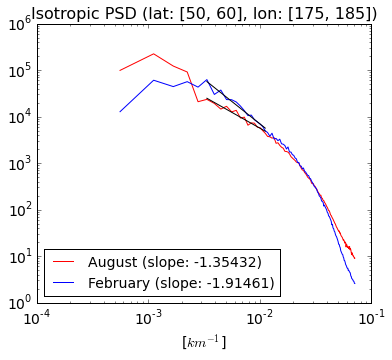

293.489759102 88.0469277306
0.00340727391327 0.0113575797109


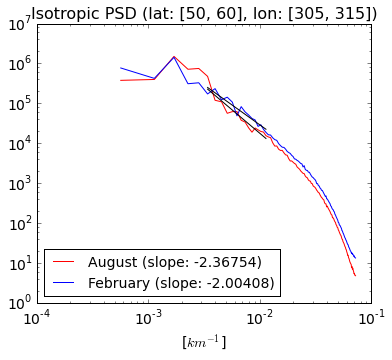

297.862385921 89.3587157762
0.00335725505223 0.0111908501741


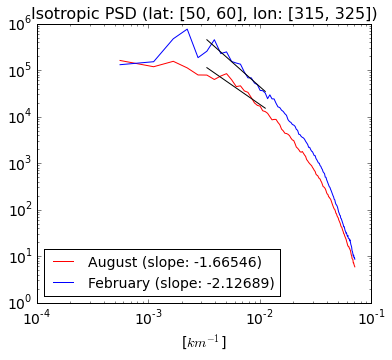

303.839641819 91.1518925456
0.00329120977768 0.0109706992589


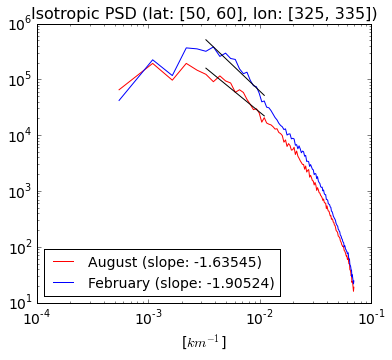

301.492069917 90.4476209752
0.00331683682518 0.0110561227506


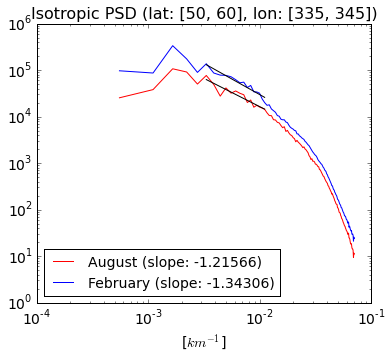

In [137]:
#latitude = np.reshape(Lat,((Degx+2)*(Degy+2),1))
#longitude = np.reshape(Lon,((Degx+2)*(Degy+2),1))

Le = 9e1
Ls = 3e2
N = 128
for j in range(Degy+1):
    for i in range(Degx+1):
        if np.all(np.isnan(isospecs_ave_summer[1,(Degx+1)*j+i])) == False and np.all(np.isnan(isospecs_ave_winter[1,(Degx+1)*j+i])) == False:
            
            Ns = np.argmin(np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls))
            Ne = np.argmin(np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le))
            print 2*np.pi/Kis[(Degx+1)*j+i,Ns]*1e-3, 2*np.pi/Kis[(Degx+1)*j+i,Ne]*1e-3
            print Kis[(Degx+1)*j+i,Ns]*.5/np.pi*1e3, Kis[(Degx+1)*j+i,Ne]*.5/np.pi*1e3
            
            ps_fit_summer, ps_slope_summer = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne+1], isospecs_ave_summer[1,(Degx+1)*j+i,Ns:Ne+1])
            ps_fit_winter, ps_slope_winter = fit_loglog(Kis[(Degx+1)*j+i,Ns:Ne+1], isospecs_ave_winter[1,(Degx+1)*j+i,Ns:Ne+1])
            plt.figure(figsize=(6,5))
            #plt.subplot(Degy+1,Degx+1,(Degx+1)*j+i+1)
            plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_ave_summer[1,(Degx+1)*j+i], 'r', label=r'August (slope: %g)' % ps_slope_summer)
            plt.loglog(Kis[(Degx+1)*j+i]*.5/np.pi*1e3, isospecs_ave_winter[1,(Degx+1)*j+i], 'b', label=r'February (slope: %g)' % ps_slope_winter)
            plt.loglog(Kis[(Degx+1)*j+i,Ns:Ne+1]*.5/np.pi*1e3, ps_fit_summer, 'k')
            plt.loglog(Kis[(Degx+1)*j+i,Ns:Ne+1]*.5/np.pi*1e3, ps_fit_winter, 'k')
            plt.xlabel('[$km^{-1}$]', fontsize=14)
            plt.legend(loc='lower left', fontsize=14)
            plt.title('Isotropic PSD (lat: [%g, %g], lon: [%g, %g])' % (Lat[j,0], Lat[j+1,0], Lon[0,i], Lon[0,i+1]), fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.show()

# Structure Function #

## Roll Function ##

In [220]:
#n = np.arange(0,np.log2(Nx/2), dtype='i4')
#ndel = len(n)
N = 6
StrucFunc_ave = np.zeros((3,(Degy+1)*(Degx+1),N))
print StrucFunc_ave.shape

(3, 420, 6)


In [221]:
L_sf = np.zeros((Degy+1,Degx+1)) 

sf_slopes_summer_global = numpy.zeros((3, Degy+1,Degx+1))
sf_levels_summer_global = numpy.zeros((3, Degy+1,Degx+1))

In [222]:
month = 7
for yearnum in range(5):
    fname = os.path.join(base_dir,
                                 'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday%1d.%04d-%02d-01.nc' 
                                 % (1, yearnum+46, month))
    fname_mat[yearnum] = fname
    f = netCDF4.Dataset(fname)
    mask = f.variables['KMT'][:] <= 1
        
    #for i in range(Nt):
        #SSH_masked[i] = 1e-2*np.roll(np.ma.masked_array(f.variables['SSH_2'][i],mask), roll, axis=1)
    
    #SSH_full[Nt*yearnum:Nt*yearnum+Nt] = SSH_masked[:, jmin_bound:jmax_bound+100, imin_bound:imax_bound+100] 
    
mask_global = np.roll(mask, roll, axis=1)[jmin_bound:jmax_bound+100, imin_bound:imax_bound+100]
print fname_mat
    
Ny, Nx = tlon.shape
    
dview.scatter('fname', fname_mat)
dview['Nx_global'] = Nx
dview['Ny_global'] = Ny
dview['Lon'] = tlon
dview['Lat'] = tlat
dview['mask'] = mask_global
dview['imin_bound'] = imin_bound
dview['imax_bound'] = imax_bound
dview['jmin_bound'] = jmin_bound
dview['jmax_bound'] = jmax_bound
dview['lon_start'] = lon_start
dview['lat_start'] = lat_start
dview['lon_end'] = lon_end
dview['lat_end'] = lat_end
dview['dlon'] = dlon
dview['dlat'] = dlat
dview['Degx'] = Degx
dview['Degy'] = Degy
dview['N'] = N

['/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0046-07-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0047-07-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0048-07-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0049-07-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0050-07-01.nc']


In [170]:
%%px
import sys
sys.path.append('/home/takaya/sst_analysis/sstanalysis/')
import popmodel
reload(popmodel)
    
crit = 0.01
j,i = (0,0)
west, south = (lon_start, lat_start)
east, north = (west+dlon, south+dlat)
nanarray = numpy.zeros(N)
nanarray[:] = numpy.NAN

while south < lat_end+dlat:
    west = lon_start
    east = west+dlon
    i = 0
    while west < lon_end+dlon:

        lonrange = numpy.array([west,east])
        latrange = numpy.array([south,north])
        lonmask = (Lon >= lonrange[0]) & (Lon < lonrange[1])
        latmask = (Lat >= latrange[0]) & (Lat < latrange[1])
        boxidx = lonmask & latmask # this won't necessarily be square
        irange = numpy.where(boxidx.sum(axis=0))[0]
        imin, imax = irange.min(), irange.max()
        jrange = numpy.where(boxidx.sum(axis=1))[0]
        jmin, jmax = jrange.min(), jrange.max()
            #print imin, imax, jmin, jmax
        
        
        region_mask = mask[jmin:jmax, imin:imax]
        Ny, Nx = region_mask.shape
        land_fraction = region_mask.sum().astype('f8') / (Ny*Nx)
            #SSH_domain = SSH[..., jmin:jmax, imin:imax]

    
        if south < lat_end+dlat:
            if west < lon_end+dlon:
                if land_fraction<crit:
                    #print 'Index range (i): ', imin, imax
                    #print 'Index range (j): ', jmin, jmax
                    # February
                    #NtFeb = 0.
                    # load data files
                    nday = 1
                    for yearnum in range(len(fname)):
                        #daynum = 0
                        #for month in np.arange(1,13):
                        #fname = os.path.join(base_dir,
                                 #'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday%1d.%04d-02-01.nc' 
                                 #% (nday, yearnum+45))
                        #print fname
                        p = popmodel.POPFile(fname[yearnum])
                        #T = p.nc.variables['SST'][:]
                        Nt_month, dx, dy, L_month, SFi_month, SFj_month, lon, lat, land_frac, MAX_LAND = p.structure_function(
                                                            varname='SST', roll=-1080, xmin=imin, xmax=imax, ymin=jmin, ymax=jmax, ymin_bound=jmin_bound, ymax_bound=jmax_bound, xmin_bound=imin_bound, xmax_bound=imax_bound)
                        if yearnum == 0:
                            StrucFunc_sum_month = numpy.zeros(N)
                            if j==0 and i==0:
                                StrucFunc_month = numpy.zeros(((Degx+1)*(Degy+1),N))
                                Ls_month = numpy.zeros(((Degx+1)*(Degy+1),N))
                        StrucFunc_sum_month += (SFi_month+SFj_month)*.5
                        #NtFeb += Nt_Feb

                        #isospec_ave_Feb = isospec_sum_Feb/yearnum
                    #
                    #print isospec_sum_Feb
                    StrucFunc_month[(Degx+1)*j+i] = StrucFunc_sum_month
                    #if (Degx+1)*j+i>=400:
                    #    print (Degx+1)*j+i
                    #    print isospecs_month[(Degx+1)*j+i]
                    Ls_month[(Degx+1)*j+i] = L_month
               
                else:
                    StrucFunc_month[(Degx+1)*j+i] = nanarray
                    Ls_month[(Degx+1)*j+i] = nanarray
                    #if (Degx+1)*j+i>=400:
                    #    print (Degx+1)*j+i
                    #    print isospecs_month[(Degx+1)*j+i]
                    #print 'Too much land coverage'
                    #Lon_global[j,i] = tlon[jmin,imin]
                    #Lat_global[j,i] = tlat[jmin,imin]
                    #Lon_max[j,i] = tlon[jmin,imax]
                    #Lat_max[j,i] = tlat[jmax,imin]
                    #Lon_upright_corn = tlon[jmax,imax]
                    #Lat_upright_corn = tlat[jmax,imax]
                    #psd_slopes_Feb_global[j,i] = np.nan
                    #psd_slopes_Aug_global[j,i] = np.nan
                    #psd_level_Feb_global[j,i] = np.nan
                    #psd_level_Aug_global[j,i] = np.nan
                    #L_1_global[j,i] = np.nan
            
                    #plt.figure(figsize=(15,4))
                    #plt.subplot(121)
                    #plt.pcolormesh(tlon[jmin:jmax, imin:imax], tlat[jmin:jmax, imin:imax], SST_domain)
                    #plt.title('SST (Land coverage: %g)' % land_frac, fontsize=16)
                    #plt.xticks(fontsize=14)
                    #plt.yticks(fontsize=14)
            #else:
                #Lon_global[j,i] = tlon[jmin,imin]
                #Lat_global[j,i] = tlat[jmin,imin]
        #else:
            #Lon_global[j,i] = tlon[jmin,imin]
            #Lat_global[j,i] = tlat[jmin,imin]
        
        #if i>0:
            #print 'Zonal range is: ', Lon_global[j,i-1], Lon_global[j,i]
        #if j>0 and i==0:
            #print '  Meridional range is: ', Lat_global[j-1,i], Lat_global[j,i]
        west = east
        east = west+dlon
        i += 1
    
    south = north
    north = south+dlat
    j += 1
    
    
StrucFuncs = numpy.reshape(StrucFunc_month.copy(),(Degx+1)*(Degy+1)*N)
Ls = numpy.reshape(Ls_month.copy(),(Degx+1)*(Degy+1)*N)

In [171]:
index = 2
Nt = dview['Nt_month']
StrucFunc_full_month = dview.gather('StrucFuncs').get()
Ls_full_month = dview.gather('Ls').get()

cluster_num = 5
StrucFunc_full = np.reshape(StrucFunc_full_month,(cluster_num,StrucFunc_full_month.shape[0]/N/cluster_num,N))
Ls = np.reshape(Ls_full_month,(cluster_num,StrucFunc_full_month.shape[0]/N/cluster_num,N))[0]
print StrucFunc_full.sum(axis=0).shape

year_num = 5
StrucFunc_ave[index] = StrucFunc_full.sum(axis=0)/(year_num*Nt[0]) 

(420, 6)


In [172]:
#Le = 9e1
#Ls = 3e2
#Ns = 0
#Ne = 0
for j in range(Degy+1):
    for i in range(Degx+1):
        #for k in np.arange(1,100):
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Lss and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Ls:
        #        Ns = k
        #        print 'Ns: ', Ns
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Le and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Lee:
        #        Ne = k
        #        print 'Ne: ', Ne
        #Ns = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls)).argmin()
        #Ne = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le)).argmin()
            #print Ns, Ne
        if np.all(np.isnan(StrucFunc_ave[index,(Degx+1)*j+i,-3:])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
            sf_fit, sf_slope = fit_loglog(Ls[(Degx+1)*j+i,-3:], StrucFunc_ave[index,(Degx+1)*j+i,-3:])
            sf_slopes_autumn_global[index,j,i] = sf_slope
            sf_levels_autumn_global[index,j,i] = sf_fit[1]
        else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
            sf_slopes_autumn_global[index,j,i] = np.NAN
            sf_levels_autumn_global[index,j,i] = np.NAN

In [173]:
from tempfile import TemporaryFile
SST_autumn_parallel_sf = TemporaryFile()
np.savez('SST_autumn_parallel_sf', slopes=sf_slopes_autumn_global, SFlevel=sf_levels_autumn_global, SF=StrucFunc_ave, L=Ls)
SST_autumn_parallel_sf.seek(0)

In [176]:
npzfile = np.load('SST_winter_parallel_sf.npz')
print npzfile.files
sf_slopes_winter_global = npzfile['slopes']
sf_levels_winter_global = npzfile['SFlevel']
sf_ave_winter = npzfile['SF']
Ls = npzfile['L']

npzfile = np.load('SST_summer_parallel_sf.npz')
print npzfile.files
sf_slopes_summer_global = npzfile['slopes']
sf_levels_summer_global = npzfile['SFlevel']
sf_ave_summer = npzfile['SF']

['SFlevel', 'slopes', 'SF', 'L']
['SFlevel', 'slopes', 'SF', 'L']


In [177]:
npzfile = np.load('SST_spring_parallel_sf.npz')
print npzfile.files
sf_slopes_spring_global = npzfile['slopes']
sf_levels_winter_global = npzfile['SFlevel']
sf_ave_spring = npzfile['SF']
Ls = npzfile['L']

npzfile = np.load('SST_autumn_parallel_sf.npz')
print npzfile.files
sf_slopes_autumn_global = npzfile['slopes']
sf_levels_summer_global = npzfile['SFlevel']
sf_ave_autumn = npzfile['SF']

['SFlevel', 'slopes', 'SF', 'L']
['SFlevel', 'slopes', 'SF', 'L']


In [127]:
print Ls[:,-2].shape

(420,)


In [210]:
#sf_levels_spring_global = numpy.zeros((3, Degy+1,Degx+1))
#sf_levels_summer_global = numpy.zeros((3, Degy+1,Degx+1))
#sf_levels_autumn_global = numpy.zeros((3, Degy+1,Degx+1))
#sf_levels_winter_global = numpy.zeros((3, Degy+1,Degx+1))


for index in range(3):
    for j in range(Degy+1):
        for i in range(Degx+1):
        #for k in np.arange(1,100):
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Lss and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Ls:
        #        Ns = k
        #        print 'Ns: ', Ns
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Le and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Lee:
        #        Ne = k
        #        print 'Ne: ', Ne
#            Ns = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls)).argmin()
#            Ne = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le)).argmin()
            #print Ns, Ne
            if np.all(np.isnan(sf_ave_spring[index,(Degx+1)*j+i,-3:])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
                sf_fit, sf_slope = fit_loglog(Ls[(Degx+1)*j+i,-3:], sf_ave_spring[index,(Degx+1)*j+i,-3:])
#                sf_slopes_spring_global[index,j,i] = sf_slope
                sf_levels_spring_global[index,j,i] = sf_fit[0]
            else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
                #sf_slopes_spring_global[index,j,i] = np.NAN
                sf_levels_spring_global[index,j,i] = np.NAN
            
            if np.all(np.isnan(sf_ave_summer[index,(Degx+1)*j+i,-3:])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
                sf_fit, sf_slope = fit_loglog(Ls[(Degx+1)*j+i,-3:], sf_ave_summer[index,(Degx+1)*j+i,-3:])
#                sf_slopes_summer_global[index,j,i] = sf_slope
                sf_levels_summer_global[index,j,i] = sf_fit[0]
            else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
#                sf_slopes_summer_global[index,j,i] = np.NAN
                sf_levels_summer_global[index,j,i] = np.NAN
            
            if np.all(np.isnan(sf_ave_autumn[index,(Degx+1)*j+i,-3:])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
                sf_fit, sf_slope = fit_loglog(Ls[(Degx+1)*j+i,-3:], sf_ave_autumn[index,(Degx+1)*j+i,-3:])
#                sf_slopes_autumn_global[index,j,i] = sf_slope
                sf_levels_autumn_global[index,j,i] = sf_fit[0]
            else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
#                sf_slopes_autumn_global[index,j,i] = np.NAN
                sf_levels_autumn_global[index,j,i] = np.NAN
            
            if np.all(np.isnan(sf_ave_winter[index,(Degx+1)*j+i,-3:])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
                sf_fit, sf_slope = fit_loglog(Ls[(Degx+1)*j+i,-3:], sf_ave_winter[index,(Degx+1)*j+i,-3:])
#                sf_slopes_winter_global[index,j,i] = sf_slope
                sf_levels_winter_global[index,j,i] = sf_fit[0]
            else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
#                sf_slopes_winter_global[index,j,i] = np.NAN
                sf_levels_winter_global[index,j,i] = np.NAN

In [213]:
from tempfile import TemporaryFile
SST_spring_parallel_sf = TemporaryFile()
np.savez('SST_spring_parallel_sf', slopes=sf_slopes_spring_global, SFlevel=sf_levels_spring_global, SF=sf_ave_spring, L=Ls)
SST_spring_parallel_sf.seek(0)

from tempfile import TemporaryFile
SST_summer_parallel_sf = TemporaryFile()
np.savez('SST_summer_parallel_sf', slopes=sf_slopes_summer_global, SFlevel=sf_levels_summer_global, SF=sf_ave_summer, L=Ls)
SST_summer_parallel_sf.seek(0)

from tempfile import TemporaryFile
SST_autumn_parallel_sf = TemporaryFile()
np.savez('SST_autumn_parallel_sf', slopes=sf_slopes_autumn_global, SFlevel=sf_levels_autumn_global, SF=sf_ave_autumn, L=Ls)
SST_autumn_parallel_sf.seek(0)

from tempfile import TemporaryFile
SST_winter_parallel_sf = TemporaryFile()
np.savez('SST_winter_parallel_sf', slopes=sf_slopes_winter_global, SFlevel=sf_levels_winter_global, SF=sf_ave_winter, L=Ls)
SST_winter_parallel_sf.seek(0)

In [201]:
npzfile = np.load('Idealized_Model/Calibration_psd_sf.npz')
print npzfile.files
slope_calib = npzfile['calibration']
slope = npzfile['x']
sf2_slope = npzfile['sf2_slope']

print slope.shape, slope_calib.shape

['x', 'sf2_slope', 'calibration']
(2001,) (2001,)


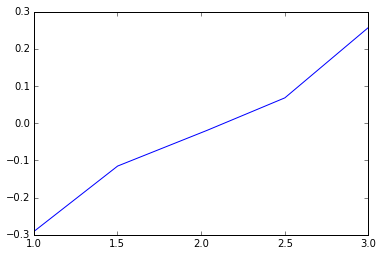

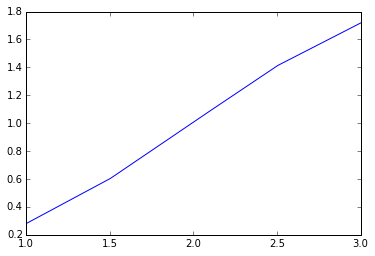

In [202]:
plt.figure()
plt.plot(slope, slope_calib)

plt.figure()
plt.plot(slope, sf2_slope)

In [203]:
sf_slopes_spring_global_calib = sf_slopes_spring_global.copy()
sf_slopes_summer_global_calib = sf_slopes_summer_global.copy()
sf_slopes_autumn_global_calib = sf_slopes_autumn_global.copy()
sf_slopes_winter_global_calib = sf_slopes_winter_global.copy()

for k in range(3):
    for i in range(Degx+1):
        for j in range(Degy+1):
            sf_slopes_spring_global_calib[k,j,i] = sf_slopes_spring_global[k,j,i]+slope_calib[np.argmin(np.abs(sf_slopes_spring_global[k,j,i]-sf2_slope))]
            sf_slopes_summer_global_calib[k,j,i] = sf_slopes_summer_global[k,j,i]+slope_calib[np.argmin(np.abs(sf_slopes_summer_global[k,j,i]-sf2_slope))]
            sf_slopes_autumn_global_calib[k,j,i] = sf_slopes_autumn_global[k,j,i]+slope_calib[np.argmin(np.abs(sf_slopes_autumn_global[k,j,i]-sf2_slope))]
            sf_slopes_winter_global_calib[k,j,i] = sf_slopes_winter_global[k,j,i]+slope_calib[np.argmin(np.abs(sf_slopes_winter_global[k,j,i]-sf2_slope))]

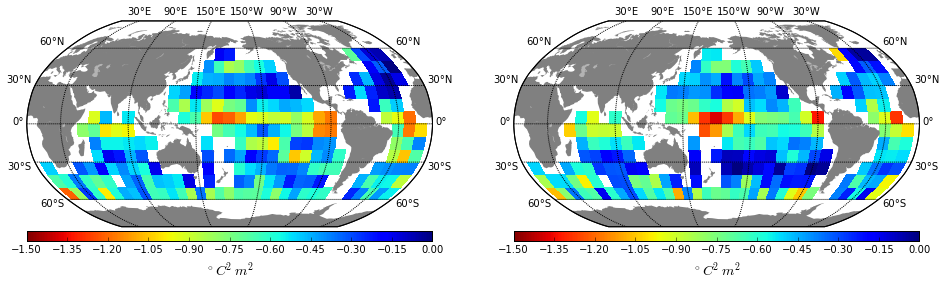

In [214]:
fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']


from mpl_toolkits.basemap import Basemap
m = Basemap(projection='robin', lon_0=180)
fig = plt.figure(figsize=(16,6))

axi = fig.add_subplot(121)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(-sf_slopes_winter_global_calib.mean(axis=0)), cmap='jet_r')
pc.set_clim([-1.5,0.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)
axi = fig.add_subplot(122)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(-sf_slopes_summer_global_calib.mean(axis=0)), cmap='jet_r')
pc.set_clim([-1.5,0.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)

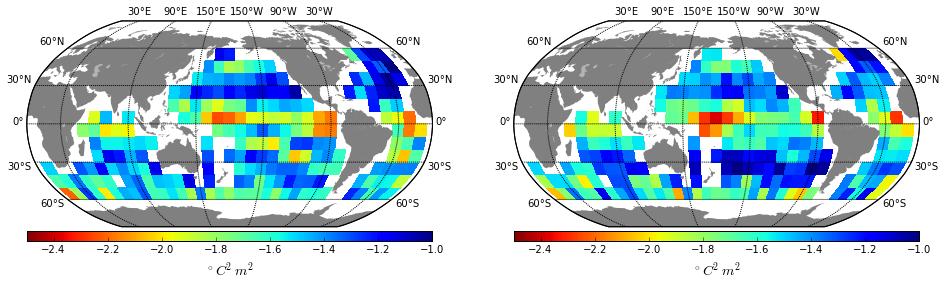

In [207]:
fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']


from mpl_toolkits.basemap import Basemap
m = Basemap(projection='robin', lon_0=180)
fig = plt.figure(figsize=(16,6))

axi = fig.add_subplot(121)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(-(sf_slopes_winter_global_calib+1.).mean(axis=0)), cmap='jet_r')
pc.set_clim([-2.5,-1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)
axi = fig.add_subplot(122)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(-(sf_slopes_summer_global_calib+1.).mean(axis=0)), cmap='jet_r')
pc.set_clim([-2.5,-1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)

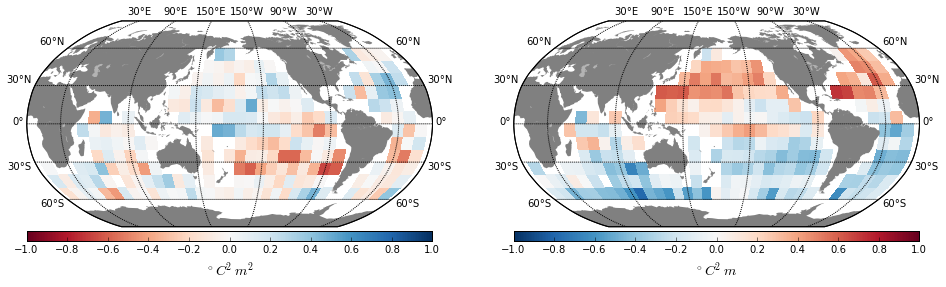

In [218]:
fig = plt.figure(figsize=(16,6))

axi = fig.add_subplot(121)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid((-(sf_slopes_winter_global_calib+1.).mean(axis=0))-(-(sf_slopes_summer_global_calib+1.).mean(axis=0))), cmap='RdBu')
pc.set_clim([-1.,1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)

axi = fig.add_subplot(122)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(np.log10(sf_levels_winter_global.mean(axis=0)/sf_levels_summer_global.mean(axis=0))), cmap='RdBu_r')
pc.set_clim([-1.,1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m$', fontsize=14)

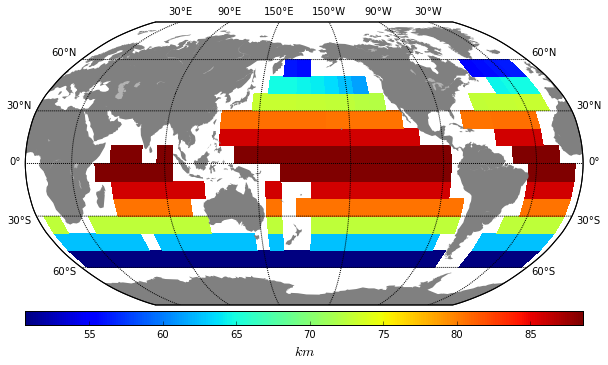

In [212]:
fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']


from mpl_toolkits.basemap import Basemap
m = Basemap(projection='robin', lon_0=180)
fig = plt.figure(figsize=(10,6))
axi = fig.add_subplot(111)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')

x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, 1e-3*np.ma.masked_invalid(np.reshape(Ls[:,-3],(Degy+1,Degx+1))), cmap='jet')
#pc.set_clim([-3.,-5./3.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$km$', fontsize=14)

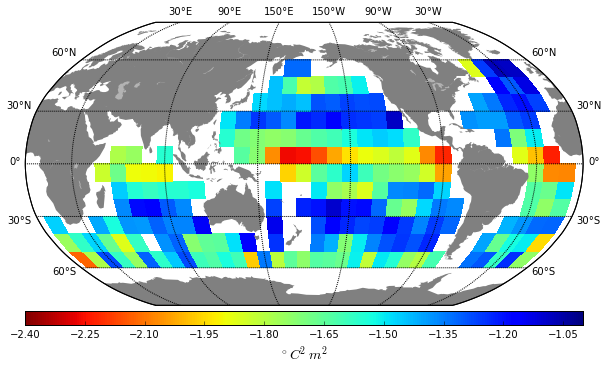

In [304]:
fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']

sf_slopes_year_global = (sf_slopes_winter_global_calib+1.).sum(axis=0)+(sf_slopes_spring_global_calib+1.).sum(axis=0)+(sf_slopes_summer_global_calib+1.).sum(axis=0)+(sf_slopes_autumn_global_calib+1.).sum(axis=0)

from mpl_toolkits.basemap import Basemap
m = Basemap(projection='robin', lon_0=180)
fig = plt.figure(figsize=(10,6))
axi = fig.add_subplot(111)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')

x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(-sf_slopes_year_global/12.), cmap='jet_r')
pc.set_clim([-2.4,-1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)

## Specify Grid Spacing ##

In [ ]:
#n = np.arange(0,np.log2(Nx/2), dtype='i4')
#ndel = len(n)
N = 6
StrucFunc_ave = np.zeros((3,(Degy+1)*(Degx+1),N))
print StrucFunc_ave.shape

In [282]:
L_sf = np.zeros((Degy+1,Degx+1)) 

sf_slopes_autumn_global = numpy.zeros((3, Degy+1,Degx+1))
sf_levels_autumn_global = numpy.zeros((3, Degy+1,Degx+1))

In [291]:
month = 12
for yearnum in range(5):
    fname = os.path.join(base_dir,
                                 'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday%1d.%04d-%02d-01.nc' 
                                 % (1, yearnum+46, month))
    fname_mat[yearnum] = fname
    f = netCDF4.Dataset(fname)
    mask = f.variables['KMT'][:] <= 1
        
    #for i in range(Nt):
        #SSH_masked[i] = 1e-2*np.roll(np.ma.masked_array(f.variables['SSH_2'][i],mask), roll, axis=1)
    
    #SSH_full[Nt*yearnum:Nt*yearnum+Nt] = SSH_masked[:, jmin_bound:jmax_bound+100, imin_bound:imax_bound+100] 
    
mask_global = np.roll(mask, roll, axis=1)[jmin_bound:jmax_bound+100, imin_bound:imax_bound+100]
print fname_mat
    
Ny, Nx = tlon.shape
    
dview.scatter('fname', fname_mat)
dview['Nx_global'] = Nx
dview['Ny_global'] = Ny
dview['Lon'] = tlon
dview['Lat'] = tlat
dview['mask'] = mask_global
dview['imin_bound'] = imin_bound
dview['imax_bound'] = imax_bound
dview['jmin_bound'] = jmin_bound
dview['jmax_bound'] = jmax_bound
dview['lon_start'] = lon_start
dview['lat_start'] = lat_start
dview['lon_end'] = lon_end
dview['lat_end'] = lat_end
dview['dlon'] = dlon
dview['dlat'] = dlat
dview['Degx'] = Degx
dview['Degy'] = Degy
dview['N'] = N

['/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0046-12-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0047-12-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0048-12-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0049-12-01.nc', '/home/../../../data/scratch/rpa/cesm/hybrid_v5_rel04_BC5_ne120_t12_pop62/hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday1.0050-12-01.nc']


In [292]:
%%px
import sys
sys.path.append('/home/takaya/sst_analysis/sstanalysis/')
import popmodel
reload(popmodel)
    
crit = 0.01
j,i = (0,0)
west, south = (lon_start, lat_start)
east, north = (west+dlon, south+dlat)
nanarray = numpy.zeros(N)
nanarray[:] = numpy.NAN

while south < lat_end+dlat:
    west = lon_start
    east = west+dlon
    i = 0
    while west < lon_end+dlon:

        lonrange = numpy.array([west,east])
        latrange = numpy.array([south,north])
        lonmask = (Lon >= lonrange[0]) & (Lon < lonrange[1])
        latmask = (Lat >= latrange[0]) & (Lat < latrange[1])
        boxidx = lonmask & latmask # this won't necessarily be square
        irange = numpy.where(boxidx.sum(axis=0))[0]
        imin, imax = irange.min(), irange.max()
        jrange = numpy.where(boxidx.sum(axis=1))[0]
        jmin, jmax = jrange.min(), jrange.max()
            #print imin, imax, jmin, jmax
        
        
        region_mask = mask[jmin:jmax, imin:imax]
        Ny, Nx = region_mask.shape
        land_fraction = region_mask.sum().astype('f8') / (Ny*Nx)
            #SSH_domain = SSH[..., jmin:jmax, imin:imax]

    
        if south < lat_end+dlat:
            if west < lon_end+dlon:
                if land_fraction<crit:
                    #print 'Index range (i): ', imin, imax
                    #print 'Index range (j): ', jmin, jmax
                    # February
                    #NtFeb = 0.
                    # load data files
                    nday = 1
                    for yearnum in range(len(fname)):
                        #daynum = 0
                        #for month in np.arange(1,13):
                        #fname = os.path.join(base_dir,
                                 #'hybrid_v5_rel04_BC5_ne120_t12_pop62.pop.h.nday%1d.%04d-02-01.nc' 
                                 #% (nday, yearnum+45))
                        #print fname
                        p = popmodel.POPFile(fname[yearnum])
                        #T = p.nc.variables['SST'][:]
                        Nt_month, dx, dy, L_month, SFi_month, SFj_month, lon, lat, land_frac, MAX_LAND = p.structure_function(
                                                            varname='SST', roll_param=False, roll=-1080, xmin=imin, xmax=imax, ymin=jmin, ymax=jmax, ymin_bound=jmin_bound, ymax_bound=jmax_bound, xmin_bound=imin_bound, xmax_bound=imax_bound)
                        if yearnum == 0:
                            StrucFunc_sum_month = numpy.zeros(N)
                            if j==0 and i==0:
                                StrucFunc_month = numpy.zeros(((Degx+1)*(Degy+1),N))
                                Ls_month = numpy.zeros(((Degx+1)*(Degy+1),N))
                        StrucFunc_sum_month += (SFi_month+SFj_month)*.5
                        #NtFeb += Nt_Feb

                        #isospec_ave_Feb = isospec_sum_Feb/yearnum
                    #
                    #print isospec_sum_Feb
                    StrucFunc_month[(Degx+1)*j+i] = StrucFunc_sum_month
                    #if (Degx+1)*j+i>=400:
                    #    print (Degx+1)*j+i
                    #    print isospecs_month[(Degx+1)*j+i]
                    Ls_month[(Degx+1)*j+i] = L_month
               
                else:
                    StrucFunc_month[(Degx+1)*j+i] = nanarray
                    Ls_month[(Degx+1)*j+i] = nanarray
                    #if (Degx+1)*j+i>=400:
                    #    print (Degx+1)*j+i
                    #    print isospecs_month[(Degx+1)*j+i]
                    #print 'Too much land coverage'
                    #Lon_global[j,i] = tlon[jmin,imin]
                    #Lat_global[j,i] = tlat[jmin,imin]
                    #Lon_max[j,i] = tlon[jmin,imax]
                    #Lat_max[j,i] = tlat[jmax,imin]
                    #Lon_upright_corn = tlon[jmax,imax]
                    #Lat_upright_corn = tlat[jmax,imax]
                    #psd_slopes_Feb_global[j,i] = np.nan
                    #psd_slopes_Aug_global[j,i] = np.nan
                    #psd_level_Feb_global[j,i] = np.nan
                    #psd_level_Aug_global[j,i] = np.nan
                    #L_1_global[j,i] = np.nan
            
                    #plt.figure(figsize=(15,4))
                    #plt.subplot(121)
                    #plt.pcolormesh(tlon[jmin:jmax, imin:imax], tlat[jmin:jmax, imin:imax], SST_domain)
                    #plt.title('SST (Land coverage: %g)' % land_frac, fontsize=16)
                    #plt.xticks(fontsize=14)
                    #plt.yticks(fontsize=14)
            #else:
                #Lon_global[j,i] = tlon[jmin,imin]
                #Lat_global[j,i] = tlat[jmin,imin]
        #else:
            #Lon_global[j,i] = tlon[jmin,imin]
            #Lat_global[j,i] = tlat[jmin,imin]
        
        #if i>0:
            #print 'Zonal range is: ', Lon_global[j,i-1], Lon_global[j,i]
        #if j>0 and i==0:
            #print '  Meridional range is: ', Lat_global[j-1,i], Lat_global[j,i]
        west = east
        east = west+dlon
        i += 1
    
    south = north
    north = south+dlat
    j += 1
    
    
StrucFuncs = numpy.reshape(StrucFunc_month.copy(),(Degx+1)*(Degy+1)*N)
Ls = numpy.reshape(Ls_month.copy(),(Degx+1)*(Degy+1)*N)

In [293]:
index = 2
Nt = dview['Nt_month']
StrucFunc_full_month = dview.gather('StrucFuncs').get()
Ls_full_month = dview.gather('Ls').get()

cluster_num = 5
StrucFunc_full = np.reshape(StrucFunc_full_month,(cluster_num,StrucFunc_full_month.shape[0]/N/cluster_num,N))
Ls = np.reshape(Ls_full_month,(cluster_num,StrucFunc_full_month.shape[0]/N/cluster_num,N))[0]
print StrucFunc_full.sum(axis=0).shape

year_num = 5
StrucFunc_ave[index] = StrucFunc_full.sum(axis=0)/(year_num*Nt[0]) 

(420, 6)


In [294]:
#Le = 9e1
#Ls = 3e2
#Ns = 0
#Ne = 0
for j in range(Degy+1):
    for i in range(Degx+1):
        #for k in np.arange(1,100):
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Lss and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Ls:
        #        Ns = k
        #        print 'Ns: ', Ns
        #    if 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 >= Le and 2*np.pi/Kis[(Degx+1)*j+i,k]*1e-3 < Lee:
        #        Ne = k
        #        print 'Ne: ', Ne
        #Ns = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls)).argmin()
        #Ne = (np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le)).argmin()
            #print Ns, Ne
        if np.all(np.isnan(StrucFunc_ave[index,(Degx+1)*j+i,-3:])) == False:
            #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[index,(Degx+1)*j+i,Ns:Ne]
            sf_fit, sf_slope = fit_loglog(Ls[(Degx+1)*j+i,-3:], StrucFunc_ave[index,(Degx+1)*j+i,-3:])
            sf_slopes_autumn_global[index,j,i] = sf_slope
            sf_levels_autumn_global[index,j,i] = sf_fit[0]
        else:
                #print Kis[(Degx+1)*j+i,Ns:Ne], isospecs_ave[(Degx+1)*j+i,Ns:Ne]
            sf_slopes_autumn_global[index,j,i] = np.NAN
            sf_levels_autumn_global[index,j,i] = np.NAN

In [295]:
from tempfile import TemporaryFile
SST_autumn_parallel_sf_test = TemporaryFile()
np.savez('SST_autumn_parallel_sf_test', slopes=sf_slopes_autumn_global, SFlevel=sf_levels_autumn_global, SF=StrucFunc_ave, L=Ls)
SST_autumn_parallel_sf_test.seek(0)

In [255]:
npzfile = np.load('SST_winter_parallel_sf_test.npz')
print npzfile.files
sf_slopes_winter_global_test = npzfile['slopes']
sf_levels_winter_global_test = npzfile['SFlevel']
sf_ave_winter_test = npzfile['SF']
Ls_test = npzfile['L']

npzfile = np.load('SST_summer_parallel_sf_test.npz')
print npzfile.files
sf_slopes_summer_global_test = npzfile['slopes']
sf_levels_summer_global_test = npzfile['SFlevel']
sf_ave_summer_test = npzfile['SF']

['SFlevel', 'slopes', 'SF', 'L']
['SFlevel', 'slopes', 'SF', 'L']


In [296]:
npzfile = np.load('SST_spring_parallel_sf_test.npz')
print npzfile.files
sf_slopes_spring_global_test = npzfile['slopes']
sf_levels_spring_global_test = npzfile['SFlevel']
sf_ave_spring_test = npzfile['SF']

npzfile = np.load('SST_autumn_parallel_sf_test.npz')
print npzfile.files
sf_slopes_autumn_global_test = npzfile['slopes']
sf_levels_autumn_global_test = npzfile['SFlevel']
sf_ave_autumn_test = npzfile['SF']

['SFlevel', 'slopes', 'SF', 'L']
['SFlevel', 'slopes', 'SF', 'L']


In [297]:
sf_slopes_spring_global_calib_test = sf_slopes_spring_global_test.copy()
sf_slopes_summer_global_calib_test = sf_slopes_summer_global_test.copy()
sf_slopes_autumn_global_calib_test = sf_slopes_autumn_global_test.copy()
sf_slopes_winter_global_calib_test = sf_slopes_winter_global_test.copy()

for k in range(3):
    for i in range(Degx+1):
        for j in range(Degy+1):
            sf_slopes_spring_global_calib_test[k,j,i] = sf_slopes_spring_global_test[k,j,i]+slope_calib[np.argmin(np.abs(sf_slopes_spring_global_test[k,j,i]-sf2_slope))]
            sf_slopes_summer_global_calib_test[k,j,i] = sf_slopes_summer_global_test[k,j,i]+slope_calib[np.argmin(np.abs(sf_slopes_summer_global_test[k,j,i]-sf2_slope))]
            sf_slopes_autumn_global_calib_test[k,j,i] = sf_slopes_autumn_global_test[k,j,i]+slope_calib[np.argmin(np.abs(sf_slopes_autumn_global_test[k,j,i]-sf2_slope))]
            sf_slopes_winter_global_calib_test[k,j,i] = sf_slopes_winter_global_test[k,j,i]+slope_calib[np.argmin(np.abs(sf_slopes_winter_global_test[k,j,i]-sf2_slope))]

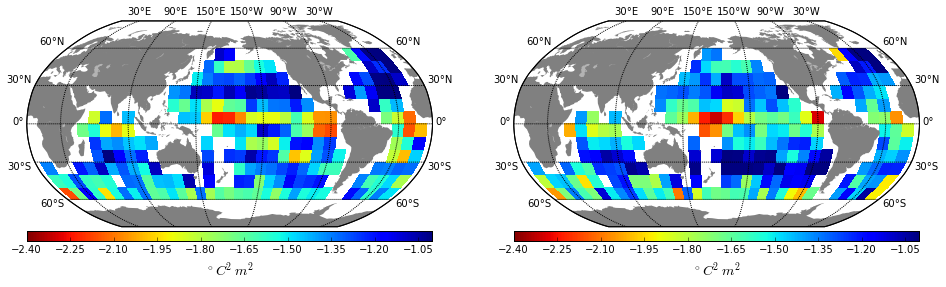

In [303]:
fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']


from mpl_toolkits.basemap import Basemap
m = Basemap(projection='robin', lon_0=180)
fig = plt.figure(figsize=(16,6))

axi = fig.add_subplot(121)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(-(sf_slopes_winter_global_calib_test+1.).mean(axis=0)), cmap='jet_r')
pc.set_clim([-2.4,-1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)
axi = fig.add_subplot(122)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(-(sf_slopes_summer_global_calib_test+1.).mean(axis=0)), cmap='jet_r')
pc.set_clim([-2.4,-1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)

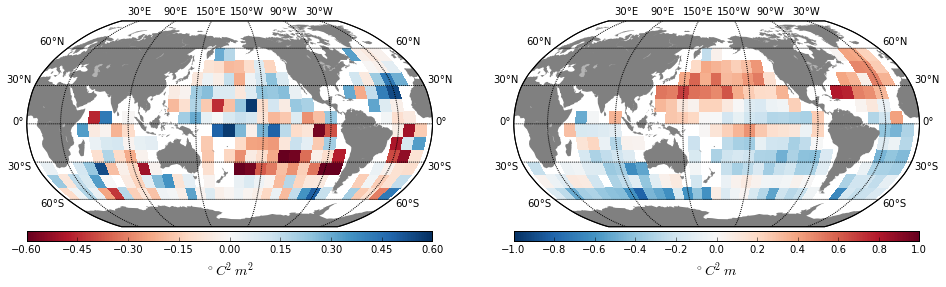

In [305]:
fig = plt.figure(figsize=(16,6))

axi = fig.add_subplot(121)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid((-(sf_slopes_winter_global_calib_test+1.).mean(axis=0))-(-(sf_slopes_summer_global_calib_test+1.).mean(axis=0))), cmap='RdBu')
pc.set_clim([-.6,.6])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)

axi = fig.add_subplot(122)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')
x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(np.log10(sf_levels_winter_global_test.mean(axis=0)/sf_levels_summer_global_test.mean(axis=0))), cmap='RdBu_r')
pc.set_clim([-1.,1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m$', fontsize=14)

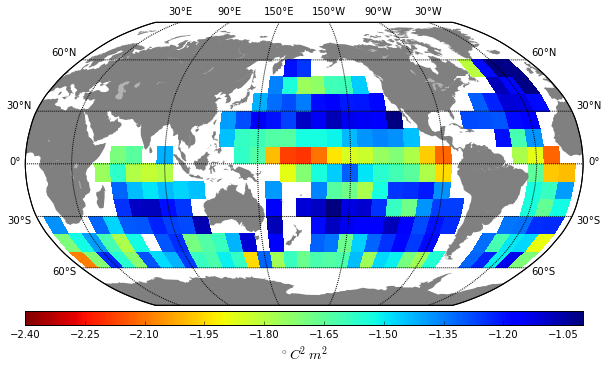

In [302]:
fname = 'psd_slope_SSH_Global.mat'
f_psd_slope = io.loadmat(fname)
Lon = f_psd_slope['Lon']
Lat = f_psd_slope['Lat']

sf_slopes_year_global_test = (sf_slopes_winter_global_calib_test+1.).sum(axis=0)+(sf_slopes_spring_global_calib_test+1.).sum(axis=0)+(sf_slopes_summer_global_calib_test+1.).sum(axis=0)+(sf_slopes_autumn_global_calib_test+1.).sum(axis=0)

from mpl_toolkits.basemap import Basemap
m = Basemap(projection='robin', lon_0=180)
fig = plt.figure(figsize=(10,6))
axi = fig.add_subplot(111)
m.fillcontinents(color='0.5', lake_color='0.7')
m.drawmapboundary(fill_color='none')

x,y = m(Lon,Lat)
pc = m.pcolormesh(x, y, np.ma.masked_invalid(-sf_slopes_year_global_test/12.), cmap='jet_r')
pc.set_clim([-2.4,-1.])
m.drawparallels(range(-60,61,30), labels=[1,1,0,0]);
m.drawmeridians(range(30,360,60), labels=[0,0,1,1]);
cbar = m.colorbar(pc, location='bottom')
cbar.set_label('$^\circ C^2 m^2$', fontsize=14)

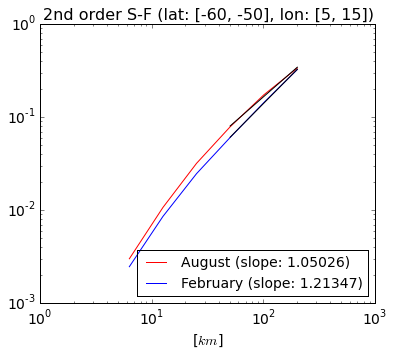

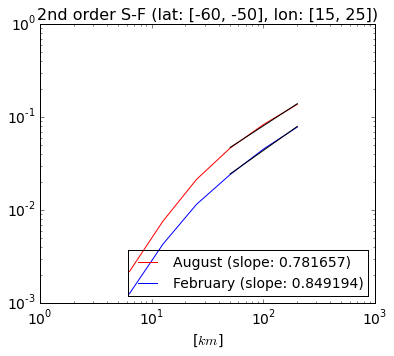

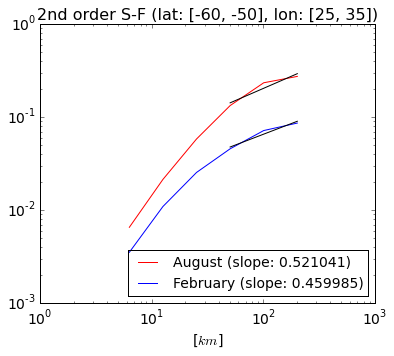

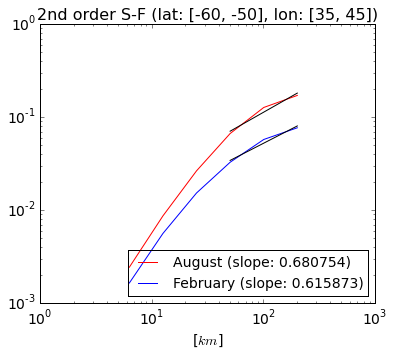

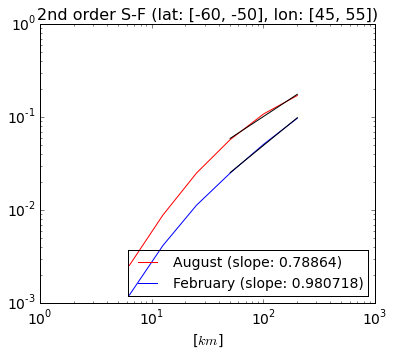

...

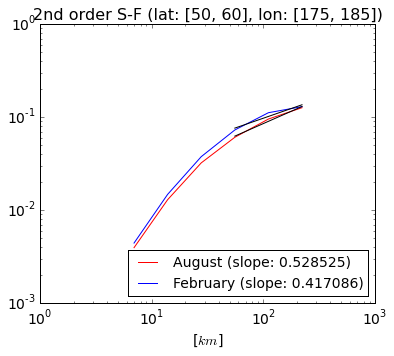

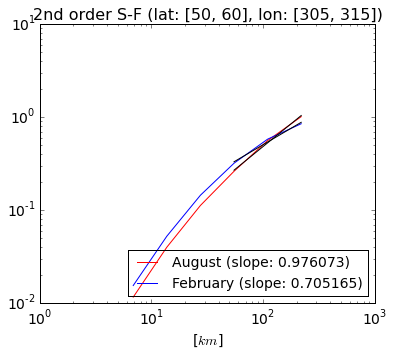

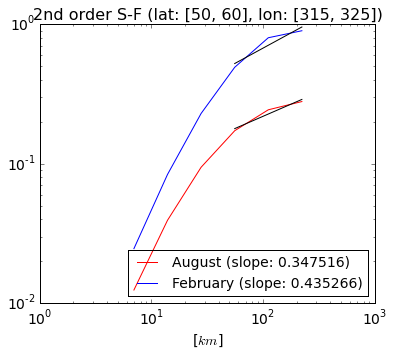

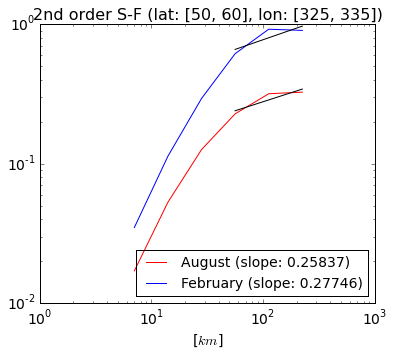

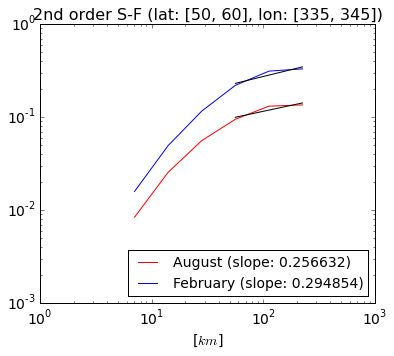

In [309]:
for j in range(Degy+1):
    for i in range(Degx+1):
        if np.all(np.isnan(sf_ave_summer_test[1,(Degx+1)*j+i])) == False and np.all(np.isnan(sf_ave_winter_test[1,(Degx+1)*j+i])) == False:
            
            #Ns = np.argmin(np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Ls))
            #Ne = np.argmin(np.abs(2*np.pi/Kis[(Degx+1)*j+i]*1e-3-Le))
            #print 2*np.pi/Kis[(Degx+1)*j+i,Ns]*1e-3, 2*np.pi/Kis[(Degx+1)*j+i,Ne]*1e-3
            #print Kis[(Degx+1)*j+i,Ns]*.5/np.pi*1e3, Kis[(Degx+1)*j+i,Ne]*.5/np.pi*1e3
            
            sf_fit_summer, sf_slope_summer = fit_loglog(Ls[(Degx+1)*j+i,-3:], sf_ave_summer_test[1,(Degx+1)*j+i,-3:])
            sf_fit_winter, sf_slope_winter = fit_loglog(Ls[(Degx+1)*j+i,-3:], sf_ave_winter_test[1,(Degx+1)*j+i,-3:])
            plt.figure(figsize=(6,5))
            #plt.subplot(Degy+1,Degx+1,(Degx+1)*j+i+1)
            plt.loglog(Ls[(Degx+1)*j+i]*1e-3, sf_ave_summer_test[1,(Degx+1)*j+i], 'r', label=r'August (slope: %g)' % sf_slope_summer)
            plt.loglog(Ls[(Degx+1)*j+i]*1e-3, sf_ave_winter_test[1,(Degx+1)*j+i], 'b', label=r'February (slope: %g)' % sf_slope_winter)
            plt.loglog(Ls[(Degx+1)*j+i,-3:]*1e-3, sf_fit_summer, 'k')
            plt.loglog(Ls[(Degx+1)*j+i,-3:]*1e-3, sf_fit_winter, 'k')
            plt.xlabel('[$km$]', fontsize=14)
            plt.legend(loc='lower right', fontsize=14)
            plt.title('2nd order S-F (lat: [%g, %g], lon: [%g, %g])' % (Lat[j,0], Lat[j+1,0], Lon[0,i], Lon[0,i+1]), fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            plt.show()